# Extract the spectrum of CTIO Data in May 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne and Jérémy Neveu
- date   : June 14th 2017


- The goal is to extract the spectrum after the rotation.


-1) First the 1 orders are extracted. One must check the rotation is correct

-2) Check the 2 orders are well aligned along X by looking at the transverse profile : if you see two peaks this means the rotation is bad.

-3) For this the central star light must having been turned off.

In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
print theNotebook

Extract_Spectrum


In [5]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt

import numpy as np
import math as m
from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os
import sys
sys.path.append("../../common_tools/")
from scan_holo import *

In [6]:
from matplotlib.backends.backend_pdf import PdfPages

In [7]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [8]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal
from matplotlib import cm

In [9]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [10]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [11]:
%load_ext Cython

In [12]:
from IPython.display import Image, display

In [13]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [14]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [15]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [16]:
def subplots_adjust(*args, **kwargs):
    """
    call signature::

      subplots_adjust(left=None, bottom=None, right=None, top=None,
                      wspace=None, hspace=None)

    Tune the subplot layout via the
    :class:`matplotlib.figure.SubplotParams` mechanism.  The parameter
    meanings (and suggested defaults) are::

      left  = 0.125  # the left side of the subplots of the figure
      right = 0.9    # the right side of the subplots of the figure
      bottom = 0.1   # the bottom of the subplots of the figure
      top = 0.9      # the top of the subplots of the figure
      wspace = 0.2   # the amount of width reserved for blank space between subplots
      hspace = 0.2   # the amount of height reserved for white space between subplots

    The actual defaults are controlled by the rc file
    """
    fig = gcf()
    fig.subplots_adjust(*args, **kwargs)
    draw_if_interactive()

### Output directory for images generated in the notebook view (not true fits images)

In [17]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [18]:
ensure_dir(dir_top_images) # create that directory

### Input fits file

In [19]:
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=141
MAX_IMGNUMBER=175
object_name='HD205905 May 31th 2017'
SelectTagRe='^rotimg_20170531_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^rotimg_20170531_[0-9]+.fits$'
NBIMGPERROW=2

### output fits file

In [20]:
outputdir="./spectrum_fitsspec"

In [21]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [22]:
input_filelist=os.listdir(inputdir) 

In [23]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [24]:
input_filelist[:5]
print len(input_filelist)

33


In [25]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [26]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list

    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                num_str=re.findall(SelectTagRe,file)[0]
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages

In [27]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [28]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [29]:
print indexes_files

[143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175]


In [30]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [31]:
sorted_numbers=indexes_files[sorted_indexes]

In [32]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32]


In [33]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [34]:
#sorted_files

## Build full filename
----------------------------

In [35]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [36]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [37]:
print sorted_filenames.shape

(33,)


## Acces to data of  images
----------------------------------

In [38]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []
all_filt= []

In [39]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
    all_filt= []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        filters = header['FILTERS'].split(' ')[1]
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        all_filt.append(filters)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt

In [40]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [41]:
len(all_images)

33

In [42]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m

from matplotlib.backends.backend_pdf import PdfPages   
    
right_edge = 1800    

def ShowImages(all_images,all_titles,object_name,dir_top_img,all_filt):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    It returns the x0, where the maximum occurs in the image
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,m.ceil(NBIMAGES/NBIMGPERROW))
    
    
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'intput_images.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    
    title='Images of {}'.format(object_name)
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70

    thex0 = []  # container of central position
  
    #f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    #f.tight_layout()
    for index in np.arange(0,NBIMAGES):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        #ix=index%NBIMGPERROW
        #iy=index/NBIMGPERROW
        image = all_images[index][:,0:right_edge]
        
        xprofile=np.sum(image,axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        
        im=axarr[iy,ix].imshow(image,origin='lower',cmap='rainbow',vmin=0,vmax=800)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        axarr[iy,ix].text(1000.,275.,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
  
    
    return thex0

/Users/dagoret-campagnesylvie/anaconda/envs/pyastrophys/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


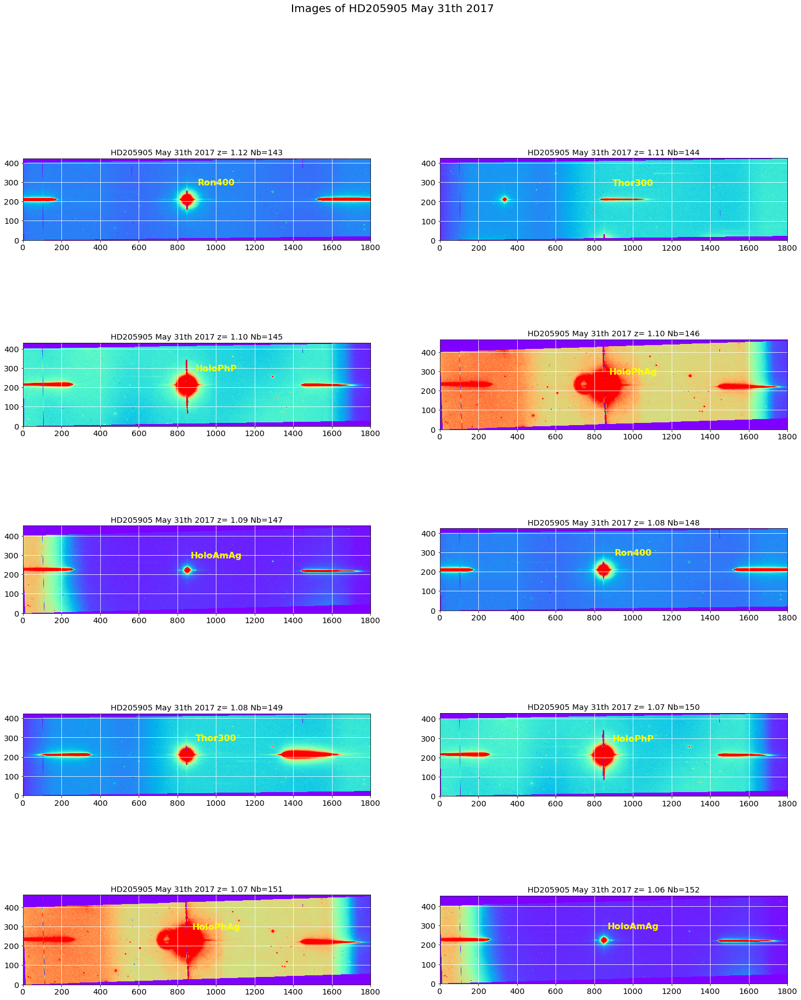

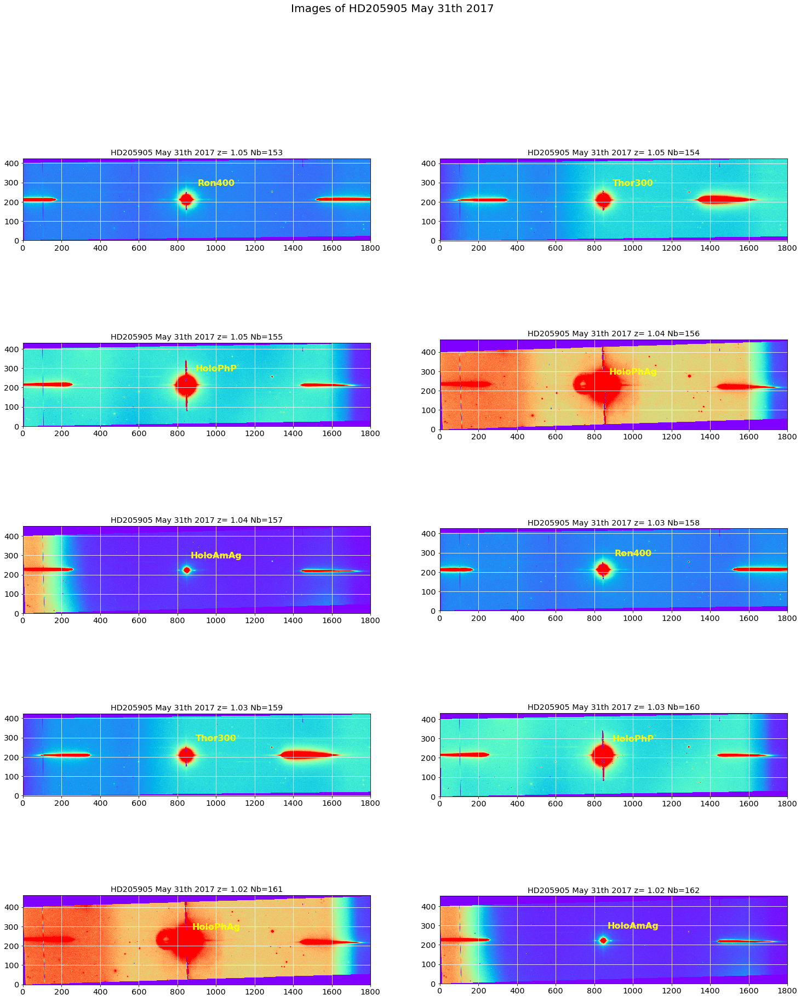

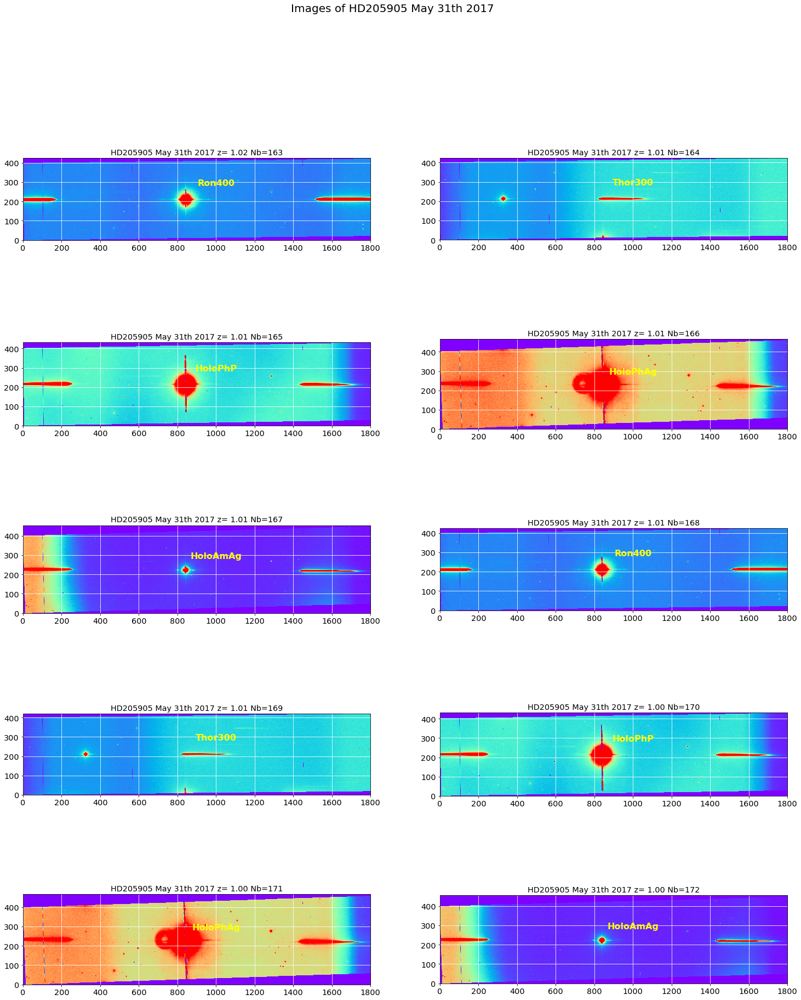

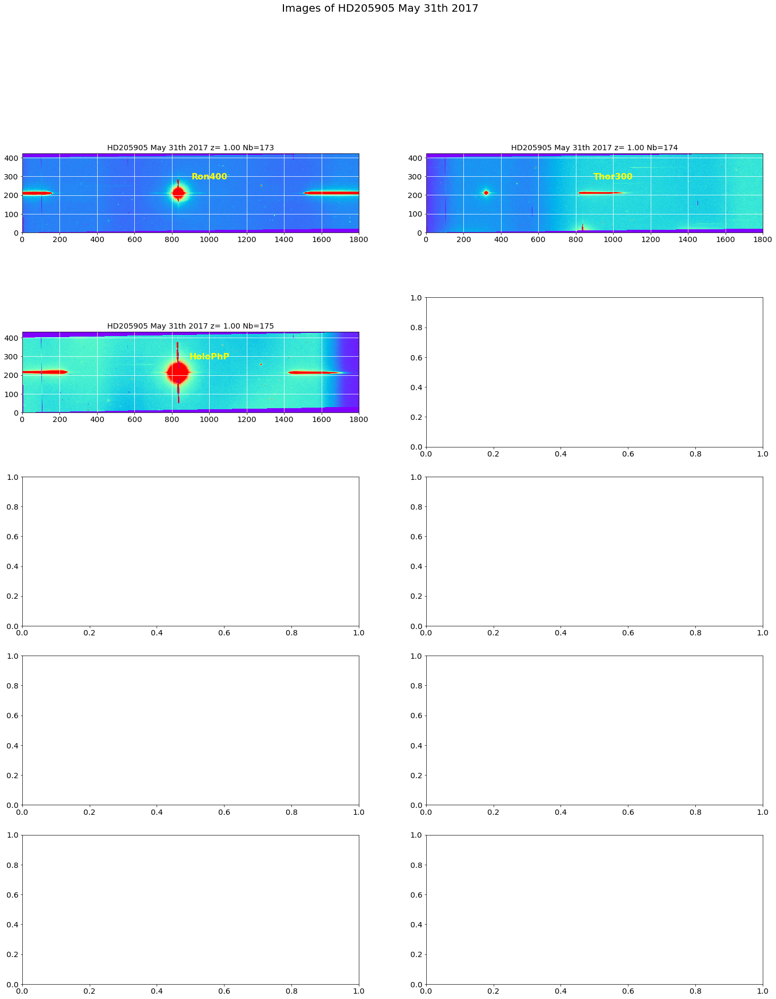

In [43]:
thex0=ShowImages(all_images,all_titles,object_name,dir_top_images,all_filt)

In [44]:
print thex0
# le thorlabs 300 a un ordre +1 dominant
x0 = int(np.median(thex0))
thex0 = x0*np.ones_like(thex0)
print x0

[848, 850, 849, 847, 848, 845, 845, 845, 845, 847, 844, 844, 845, 844, 846, 844, 844, 845, 851, 844, 841, 843, 840, 848, 840, 838, 839, 839, 836, 837, 832, 834, 829]
844


In [45]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m

from matplotlib.backends.backend_pdf import PdfPages   



def ShowOneOrder(all_images,all_titles,x0,object_name,all_expo,dir_top_img,all_filt,figname):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,m.ceil(NBIMAGES/NBIMGPERROW))
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    
    
    figfilename=os.path.join(dir_top_img,figname)   
    title='Images of {}'.format(object_name)
    
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,figname)
    pp = PdfPages(figfilename) # create a pdf file
    
    
    for index in np.arange(0,NBIMAGES):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
                
        
        full_image=np.copy(all_images[index])
        
        yprofile=np.sum(full_image[:,spec_index_min:spec_index_max],axis=1)
        y0=np.where(yprofile==yprofile.max())[0][0]
        
      
        
        if(all_expo[index]<=0 ): #special case of the first image
            reduc_image=full_image[y0-20:y0+20,x0+200:spec_index_max]  
        else:
            reduc_image=full_image[y0-20:y0+20,x0+200:spec_index_max]/all_expo[index] 
            
        themax=reduc_image.flatten().max()    
            
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))       
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=themax*0.5)    # pcolormesh is impracticalble in pdf file 
        
        
        #im = axarr[iy,ix].imshow(reduc_image,origin='lower', cmap='rainbow',vmin=0,vmax=100)    
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        axarr[iy,ix].set_title(all_titles[index])
    
        axarr[iy,ix].grid(color='white', ls='solid')
        axarr[iy,ix].text(700,2.,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            print "pdf Page written ",PageNum
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    print "Final pdf Page written ",PageNum
    f.show()
    pp.close()
  
    
    

pdf Page written  1
pdf Page written  2
pdf Page written  3
Final pdf Page written  3


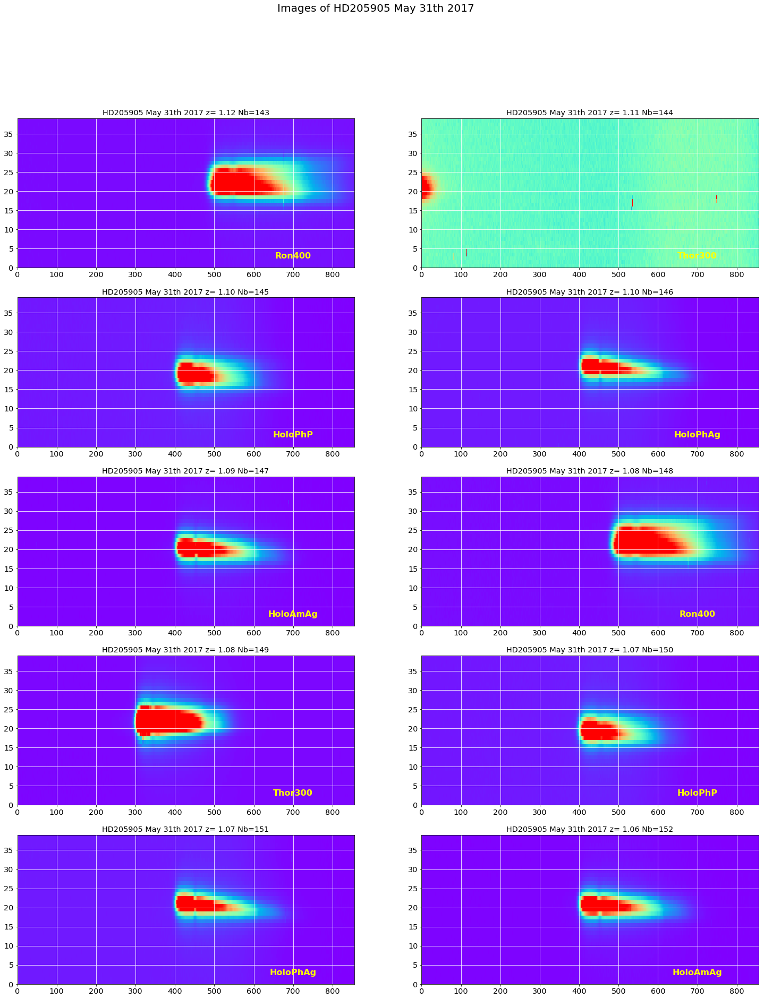

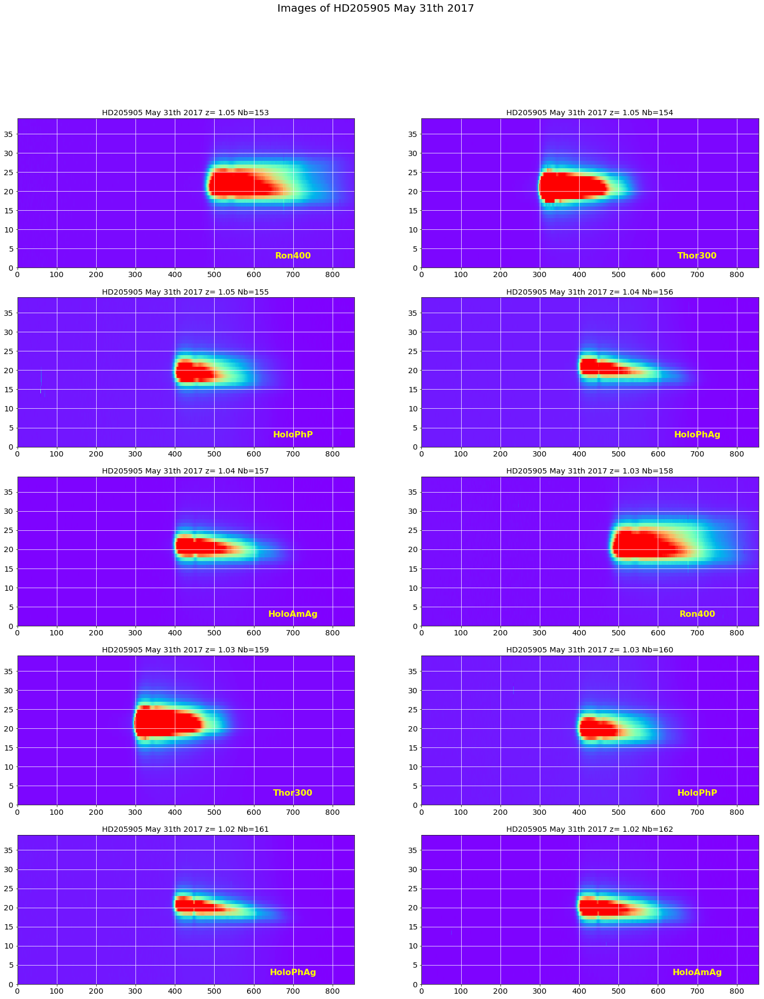

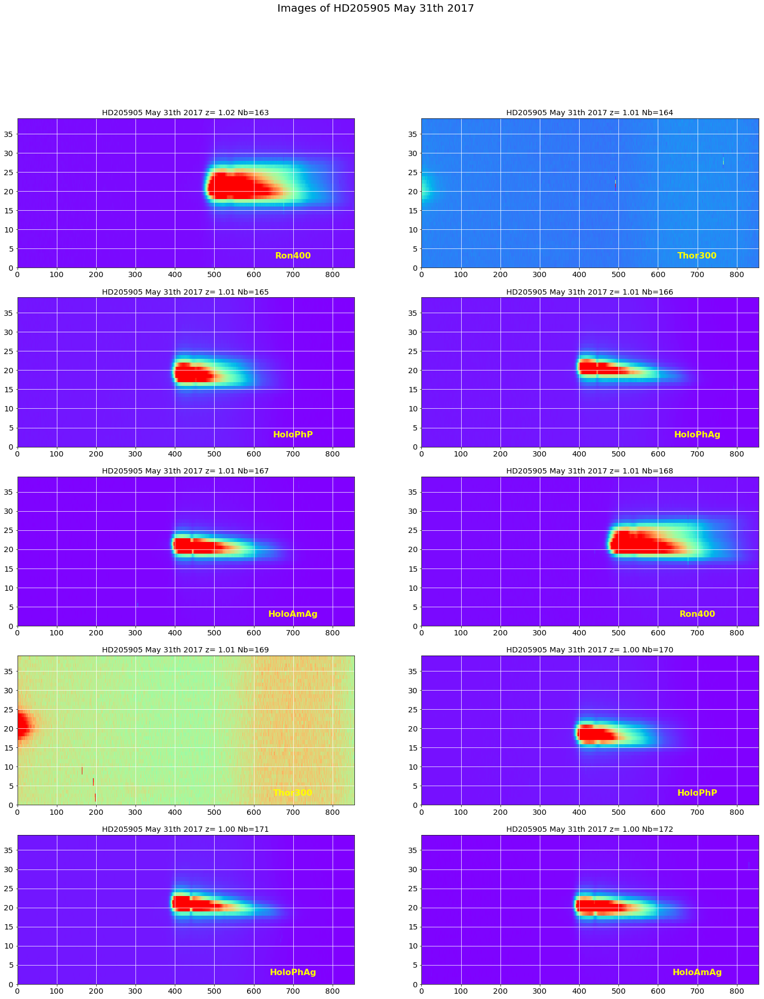

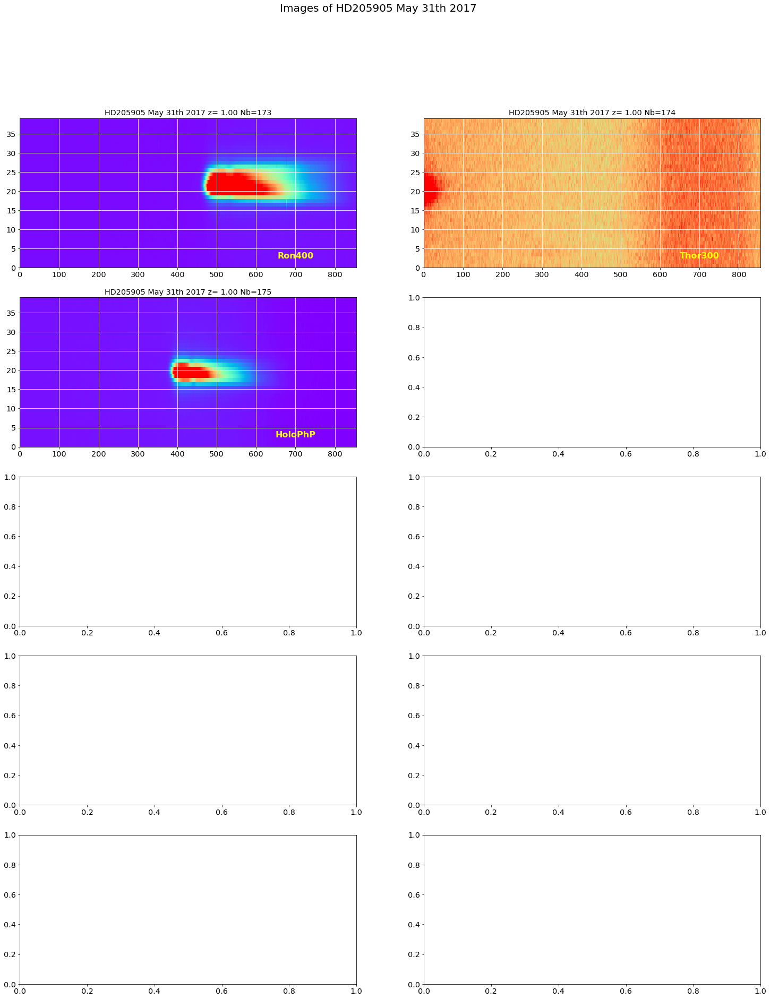

In [46]:
ShowOneOrder(all_images,all_titles,x0,object_name,all_expo,dir_top_images,all_filt,'firstorderright.pdf')

In [47]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m

from matplotlib.backends.backend_pdf import PdfPages   



def ShowOneOrder_contour(all_images,all_titles,x0,object_name,all_expo,dir_top_img,all_filt,figname):
    """
    ShowRawImages_contour: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,m.ceil(NBIMAGES/NBIMGPERROW))
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    
    
    figfilename=os.path.join(dir_top_img,figname)   
    title='Images of {}'.format(object_name)
    
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,figname)
    pp = PdfPages(figfilename) # create a pdf file
    
    
    for index in np.arange(0,NBIMAGES):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
                
        
        full_image=np.copy(all_images[index])
        
        yprofile=np.sum(full_image[:,spec_index_min:spec_index_max],axis=1)
        y0=np.where(yprofile==yprofile.max())[0][0]
        
      
        
        if(all_expo[index]<=0 ): #special case of the first image
            reduc_image=full_image[y0-20:y0+20,x0+200:spec_index_max]  
        else:
            reduc_image=full_image[y0-20:y0+20,x0+200:spec_index_max]/all_expo[index] 
            
        themax=reduc_image.flatten().max()    
            
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))  
        
        T=np.transpose(reduc_image)
        
        #im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=themax*0.5)    # pcolormesh is impracticalble in pdf file 
        axarr[iy,ix].contourf(X, Y, reduc_image, 8, alpha=.75, cmap='jet')
        C = axarr[iy,ix].contour(X, Y, reduc_image , 8, colors='black', linewidth=.5)
        
            
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        axarr[iy,ix].set_title(all_titles[index])
    
        axarr[iy,ix].grid(color='white', ls='solid')
        axarr[iy,ix].text(700,2.,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='black', fontweight='bold',fontsize=16)
        
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            print "pdf Page written ",PageNum
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    print "Final pdf Page written ",PageNum
    f.show()
    pp.close()
  
    
    

pdf Page written  1
pdf Page written  2
pdf Page written  3
Final pdf Page written  3


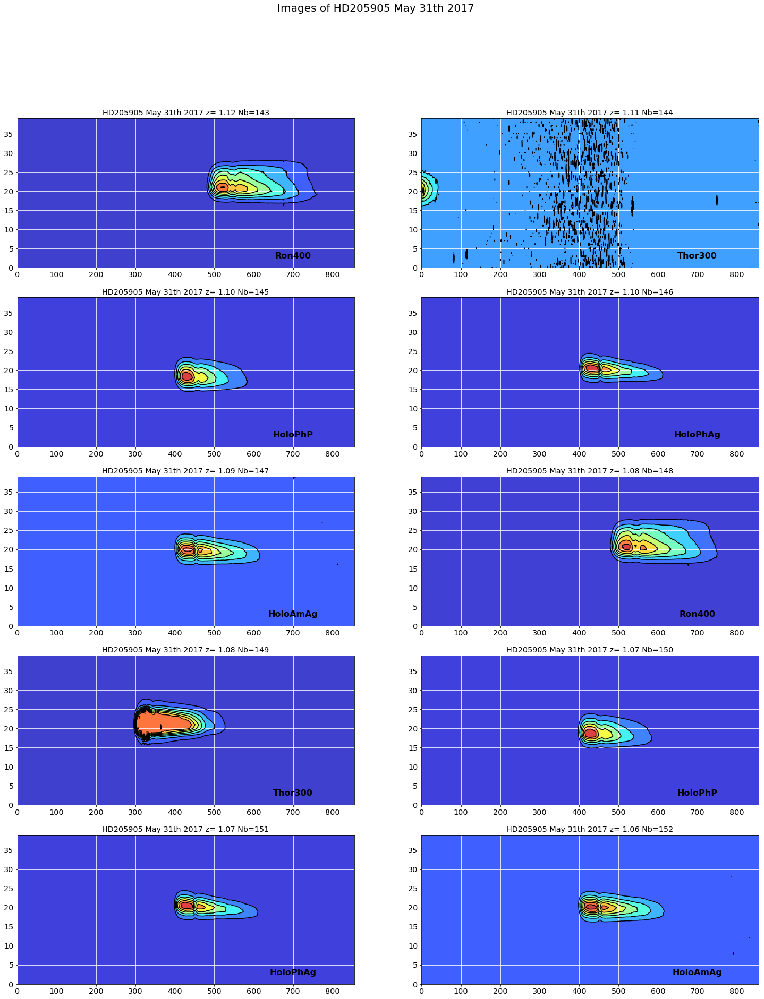

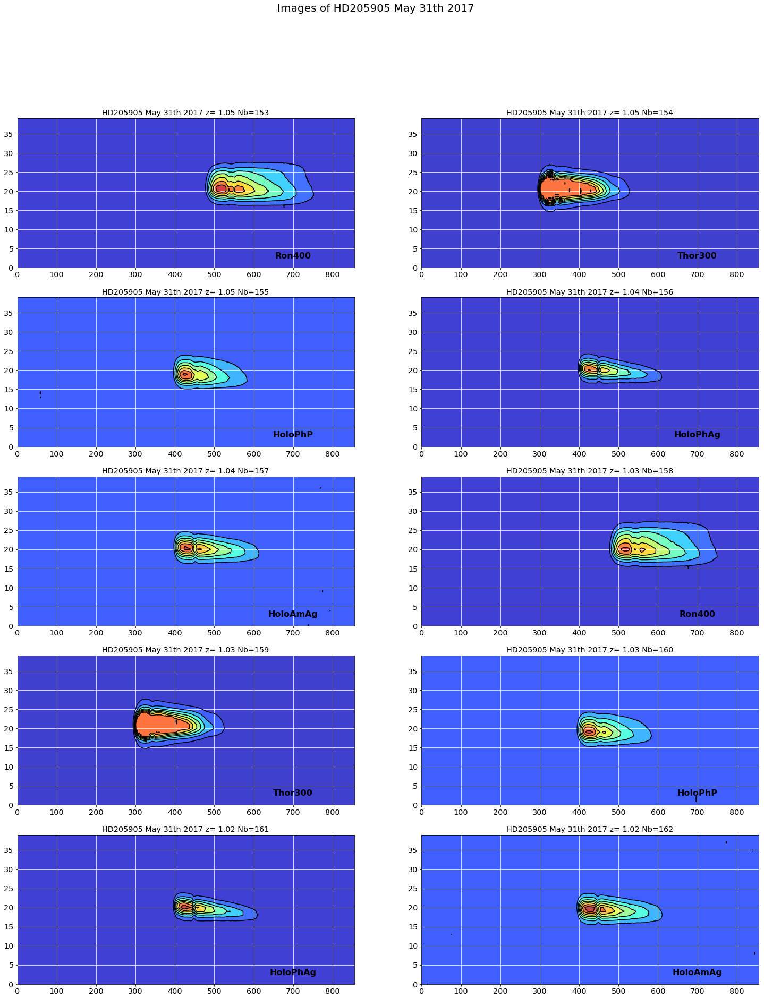

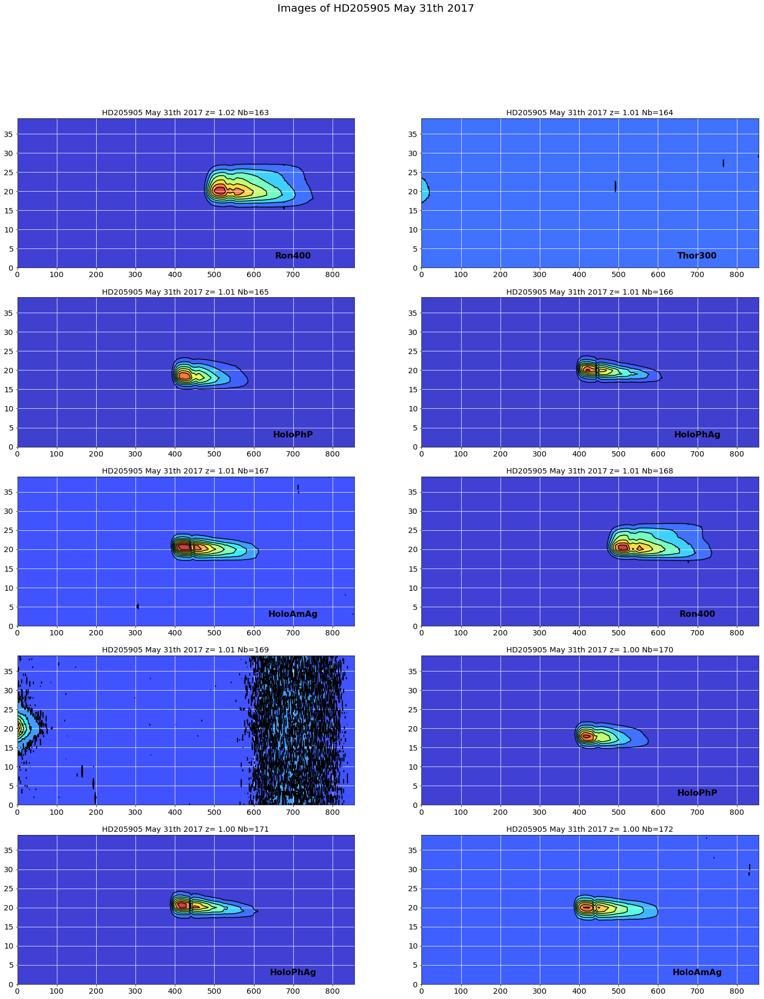

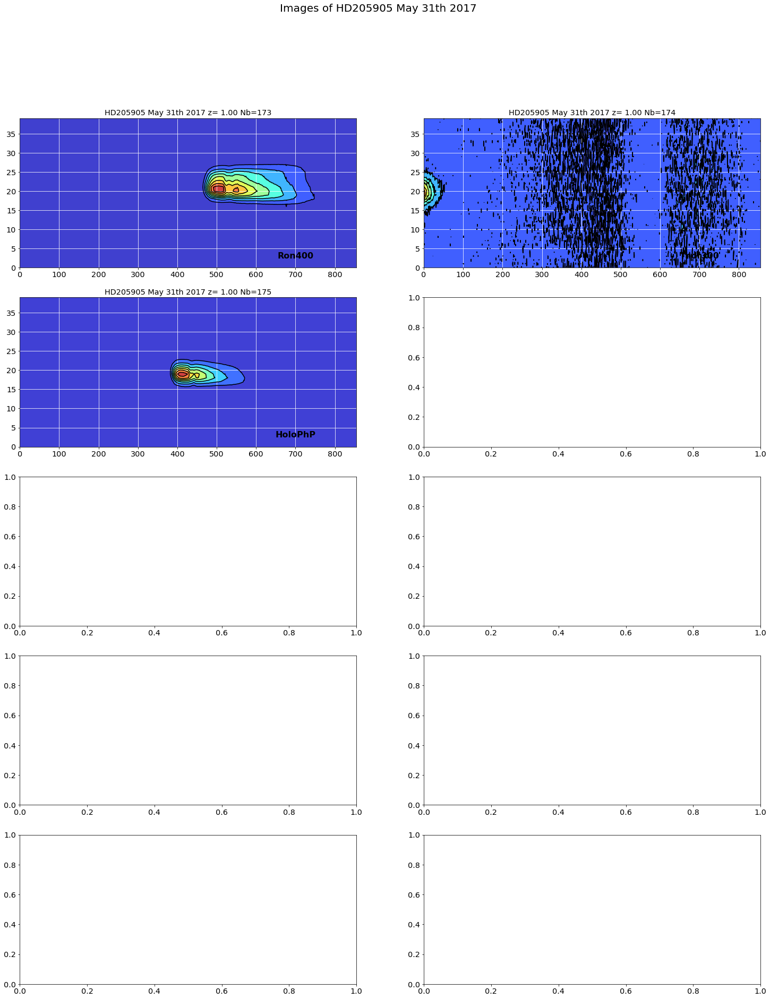

In [48]:
ShowOneOrder_contour(all_images,all_titles,x0,object_name,all_expo,dir_top_images,all_filt,'firstorderright_contour.pdf')

### Shows the transverse profile

In [49]:
DeltaX=600
w=20
ws=70

In [50]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

import math as m

from matplotlib.backends.backend_pdf import PdfPages 


def ShowTransverseProfile(all_images,x0,all_titles,object_name,all_expo,dir_top_img):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    The goal is to see in y, where is the spectrum maximum. Returns they0
    
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,m.ceil(NBIMAGES/NBIMGPERROW))
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70  
    
    
    title='Spectrum tranverse profile '.format(object_name)
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    
    figfilename=os.path.join(dir_top_img,'transverse_profile.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    
    

    ############       Criteria for spectrum region selection #####################
    DeltaX=1000
    w=10
    ws=80
    Dist=4*w
    right_edge = 1800
    ##############################################################################
    
    # containers
    thespectra= []
    thespectraUp=[]
    thespectraDown=[]
    
    they0 = []  # container for the y value
    
    # loop on images
    #-----------------
    for index in np.arange(0,NBIMAGES):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        data=np.copy(all_images[index])[:,0:right_edge]

        # Do not erase central star please
        #data[:,x0-100:x0+100]=0 ## TURN OFF CENTRAL STAR
        
        if(all_expo[index]<=0):            
            yprofile=np.sum(data,axis=1)
        else:
            yprofile=np.sum(data,axis=1)/all_expo[index]
            
            
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        
        #y0 = they0[index]
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        
        ##########################################################
        #### Here extract the spectrum around the central star
        #####   Take the sum un bins along y
        #############################################################
        
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)

        
        ### Lateral bands to remove sky background
        ### ---------------------------------------
        spectrum2DUp=np.copy(data[y0-w+Dist:y0+w+Dist,:])
        xprofileUp=np.median(spectrum2DUp,axis=0)*2.*float(w)

        spectrum2DDown=np.copy(data[y0-w-Dist:y0+w-Dist,:])
        xprofileDown=np.median(spectrum2DDown,axis=0)*2.*float(w)
        
        
        if(all_expo[index]<=0):
            thespectra.append(xprofile)
            thespectraUp.append(xprofileUp)
            thespectraDown.append(xprofileDown)
        else:  ################## HERE I NORMALISE WITH EXPO TIME ####################################
            thespectra.append(xprofile/all_expo[index])
            thespectraUp.append(xprofileUp/all_expo[index]) 
            thespectraDown.append(xprofileDown/all_expo[index]) 

        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
  
    
    return thespectra,thespectraUp,thespectraDown,they0

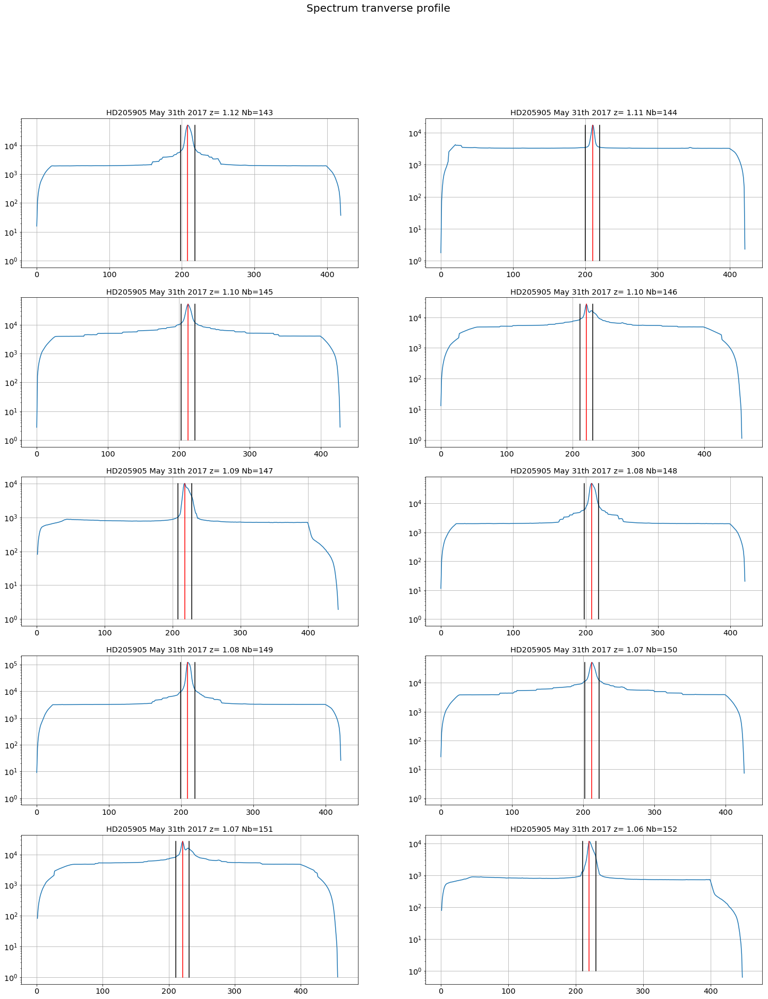

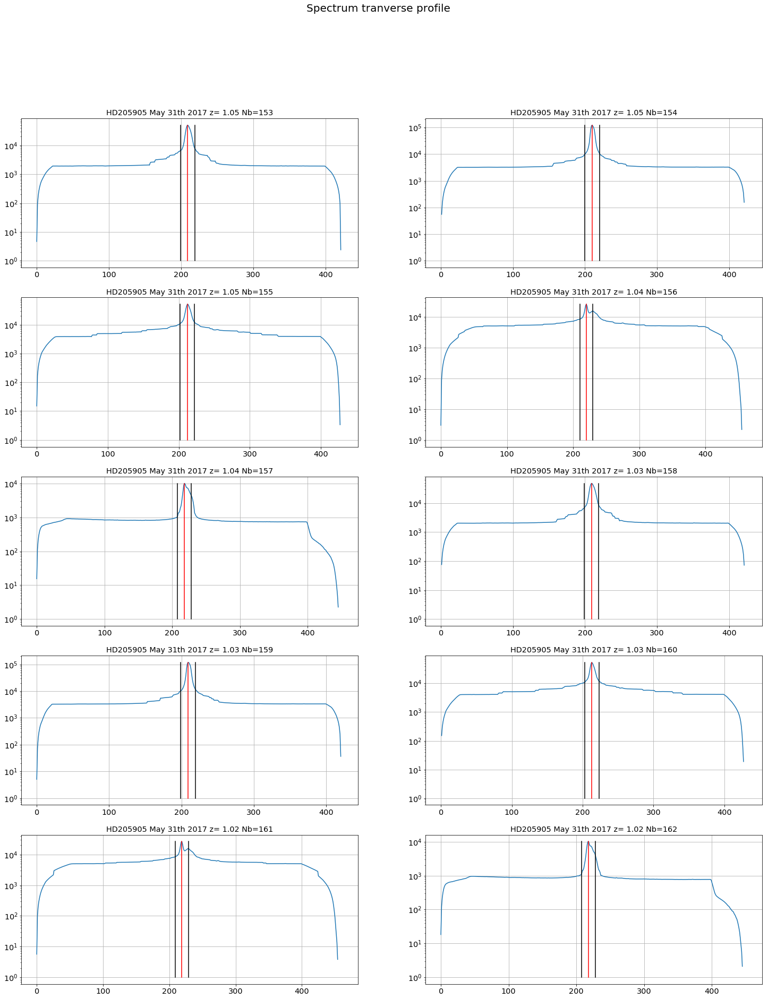

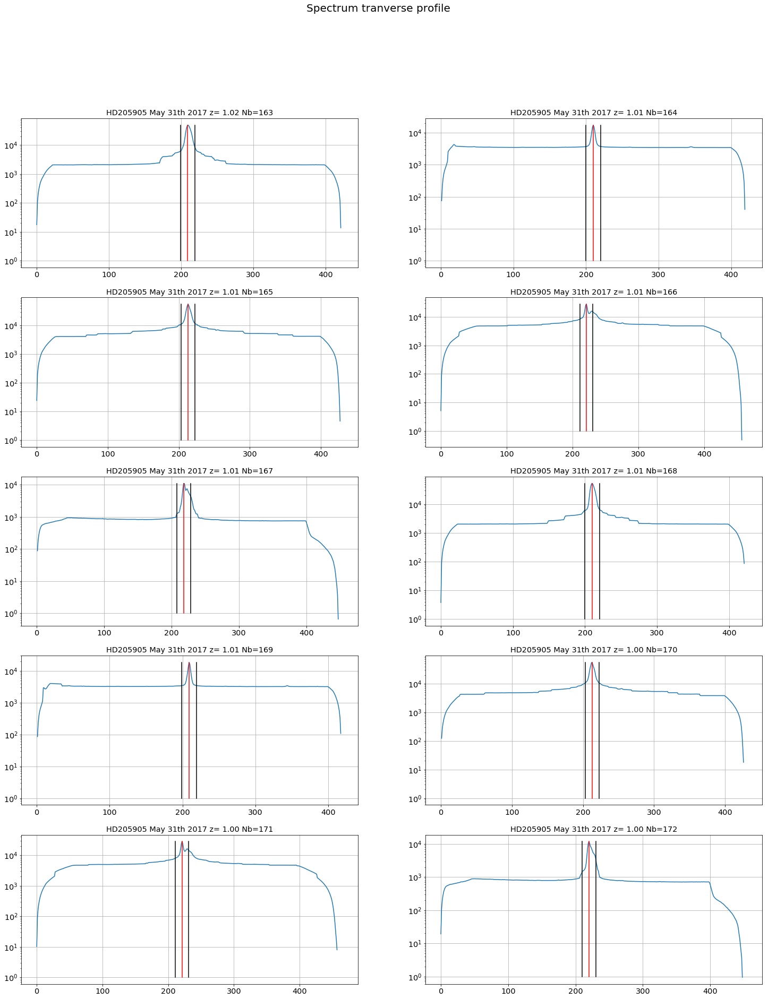

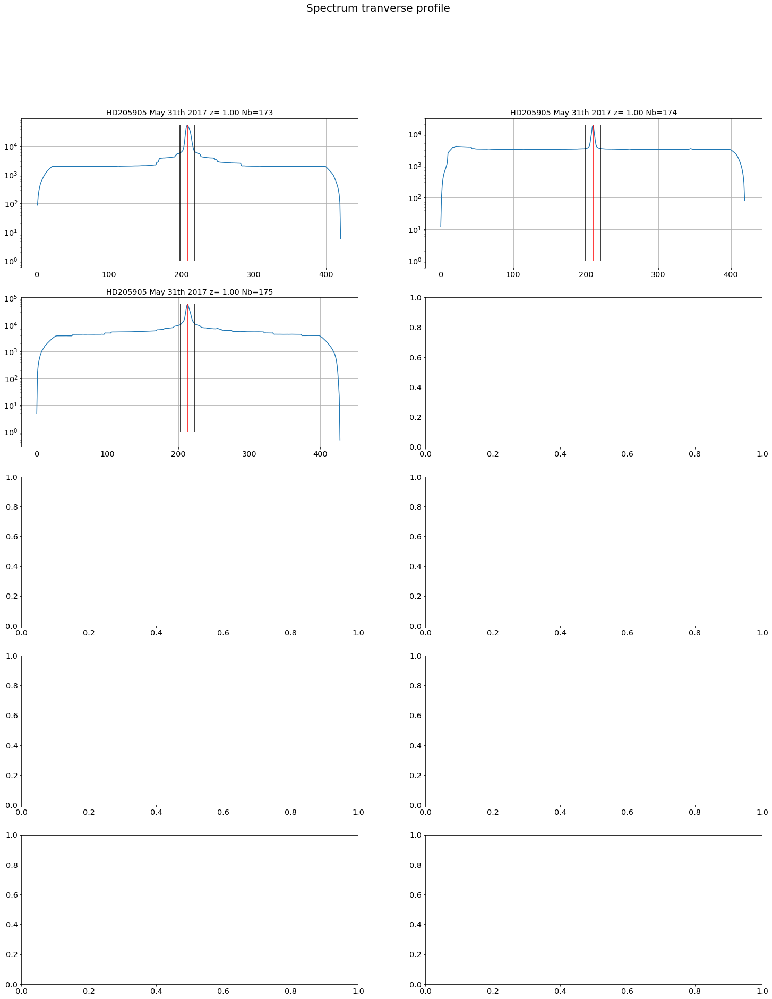

In [51]:
thespectra,thespectraUp,thespectraDown,they0=ShowTransverseProfile(all_images,x0,all_titles,object_name,all_expo,dir_top_images)

In [52]:
print they0

[208, 210, 213, 221, 218, 208, 209, 212, 221, 220, 209, 210, 212, 220, 218, 209, 209, 213, 219, 218, 209, 210, 213, 221, 218, 210, 209, 213, 221, 220, 208, 210, 213]


In [53]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def ShowRightOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    f.tight_layout()
    
    right_edge = 1800
    
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        full_image=np.copy(all_images[index])[:,0:right_edge]
        y_0=they0[index]
        x_0=thex0[index]

        reduc_image=full_image[y_0-20:y_0+20,x_0+100:right_edge]/all_expo[index]
        
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=100)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Right part of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'rightorder.pdf')
    
    #plt.savefig(figfilename)  

In [54]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def ShowLeftOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERROW)+1
    #thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,4*MAXIMGROW))
    f.tight_layout()

    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERROW
        iy=index/NBIMGPERROW
        full_image=np.copy(all_images[index])
        y_0=they0[index]
        x_0=thex0[index]
        
        
        reduc_image=full_image[y_0-20:y_0+20,0:x_0-100]/all_expo[index] 

        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))
        im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=30)
        #axarr[iy,ix].colorbar(im, orientation='vertical')
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        
        axarr[iy,ix].set_title(all_titles[index])
        
    
    title='Left part of spectrum of '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'leftorder.pdf')
    #plt.savefig(figfilename)  

### Right order

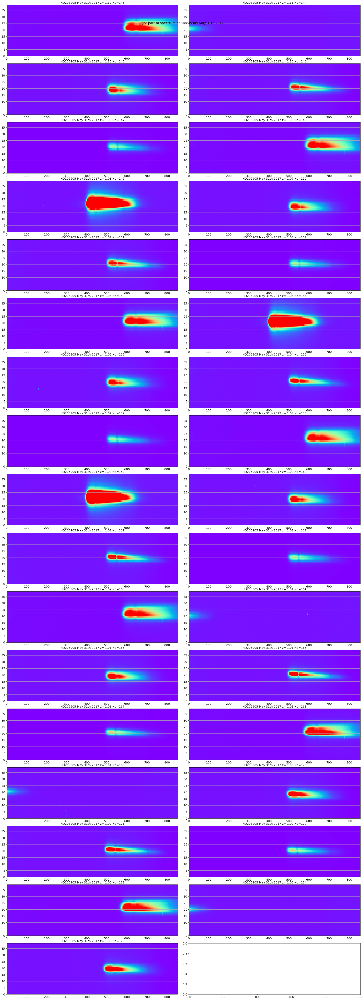

In [55]:
ShowRightOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images)

### Left order

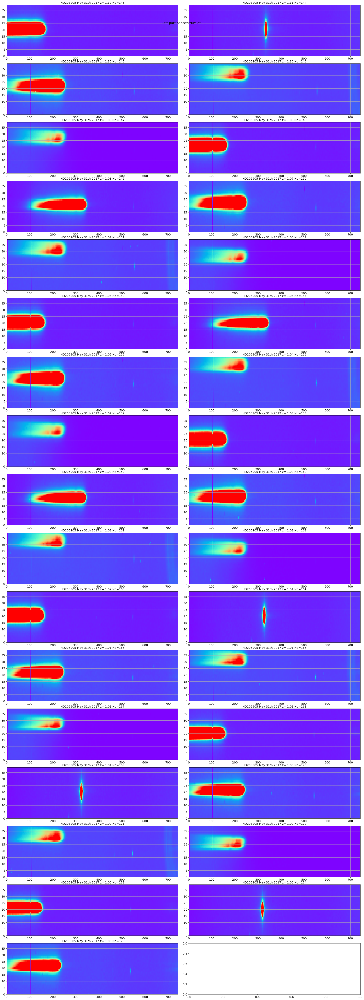

In [56]:
ShowLeftOrder(all_images,thex0,they0,all_titles,object_name,all_expo,dir_top_images)

In [57]:
def CleanBadPixels(spectraUp,spectraDown):
    
    Clean_Up= []
    Clean_Do = []
    Clean_Av = []
    eps=25.   # this is the minumum background Please check
    NBSPEC=len(spectraUp)
    for index in np.arange(0,NBSPEC):
        s_up=spectraUp[index]
        s_do=spectraDown[index]
    
        index_up=np.where(s_up<eps)
        index_do=np.where(s_do<eps)
        
        s_up[index_up]=s_do[index_up]
        s_do[index_do]=s_up[index_do]
        s_av=(s_up+s_do)/2.
        
        Clean_Up.append(s_up)
        Clean_Do.append(s_do)
        Clean_Av.append(s_av)
        
    return Clean_Up, Clean_Do,Clean_Av 

In [58]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

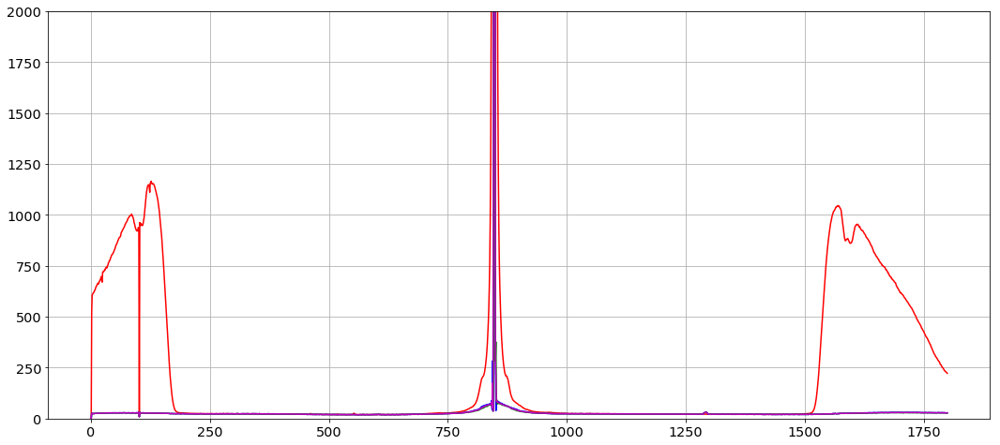

In [59]:
sel=0
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,2000.)
figfilename=os.path.join(dir_top_images,'bckg_sample.pdf')
plt.savefig(figfilename) 

In [60]:
def ShowLongitBackground(spectra,spectraUp,spectraDown,spectraAv,all_titles,object_name,dir_top_images):
    """
    Show the background to be removed to the spectrum
    
    Implemented to write in a pdf file
    
    """
    NBSPEC=len(spectra)
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Longitudinal background Up/Down'.format(object_name)
    
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    for index in np.arange(0,NBSPEC):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        # plot what is wanted
        axarr[iy,ix].plot(spectra[index],'r-')
        axarr[iy,ix].plot(spectraUp[index],'b-')
        axarr[iy,ix].plot(spectraDown[index],'g-')
        axarr[iy,ix].plot(spectraAv[index],'m-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        
        star_pos=np.where(spectra[index][:spec_index_max]==spectra[index][:spec_index_max].max())[0][0]
        max_y_to_plot=(spectra[index][star_pos+star_halfwidth:spec_index_max]).max()*1.2
        
        
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(spec_index_min,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
        
    
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()

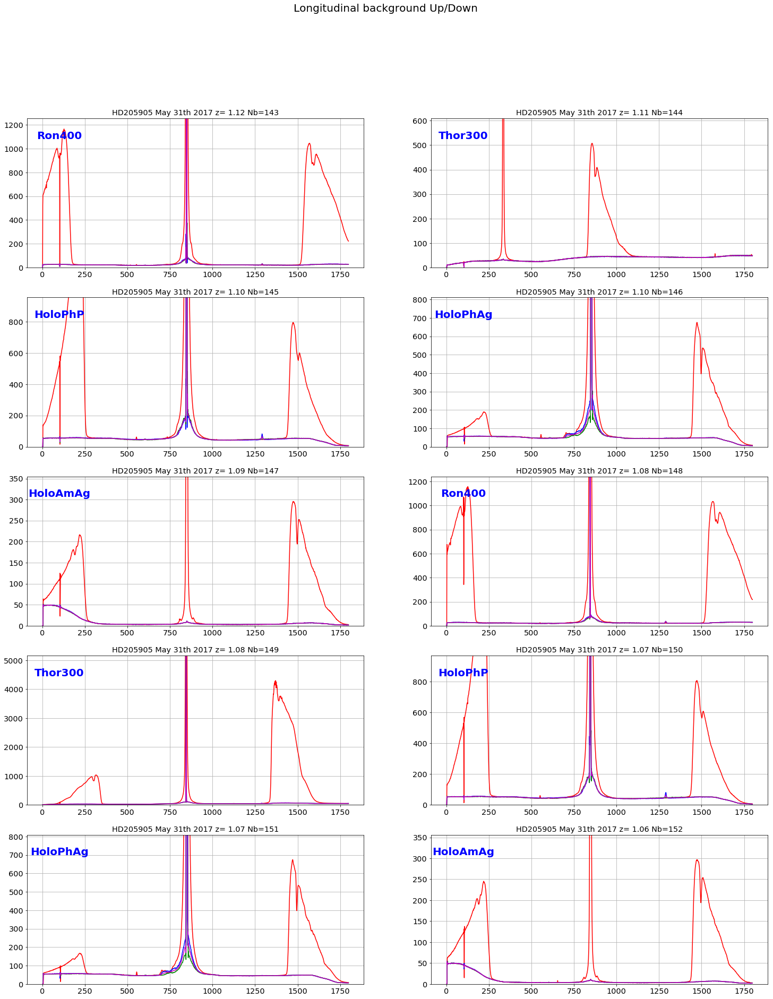

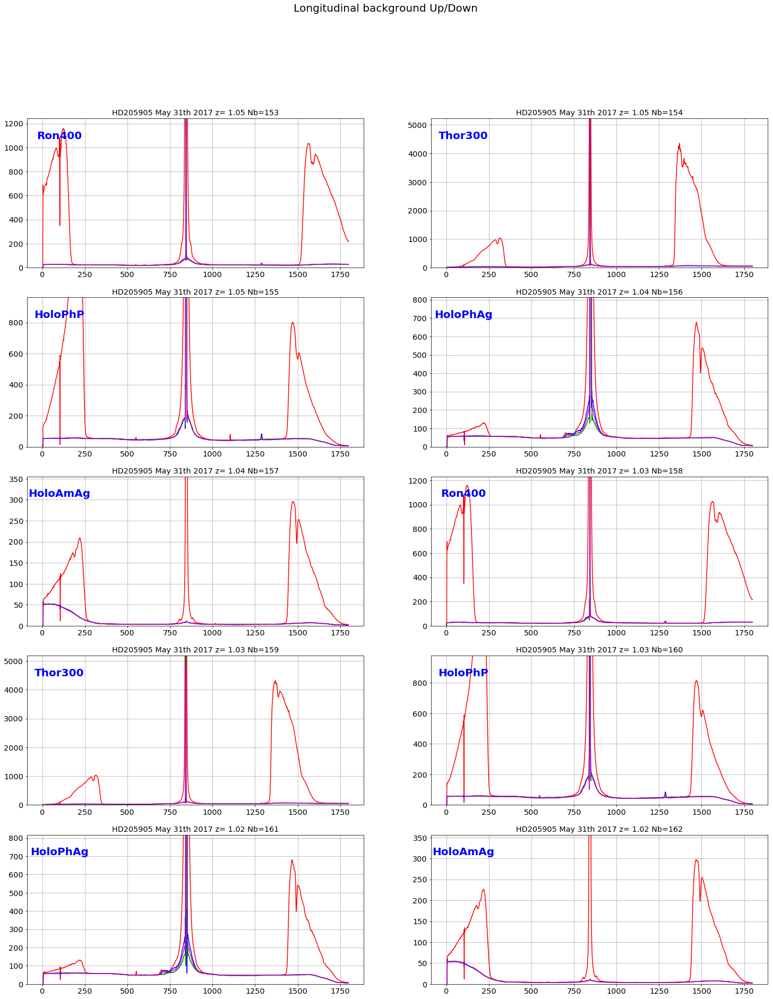

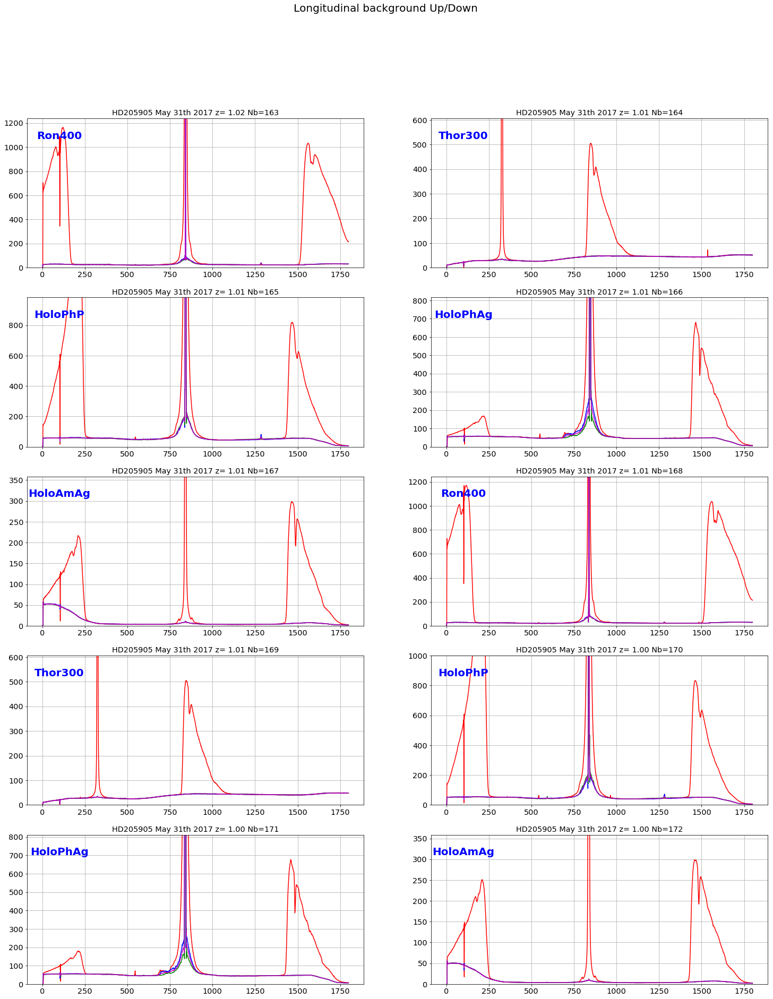

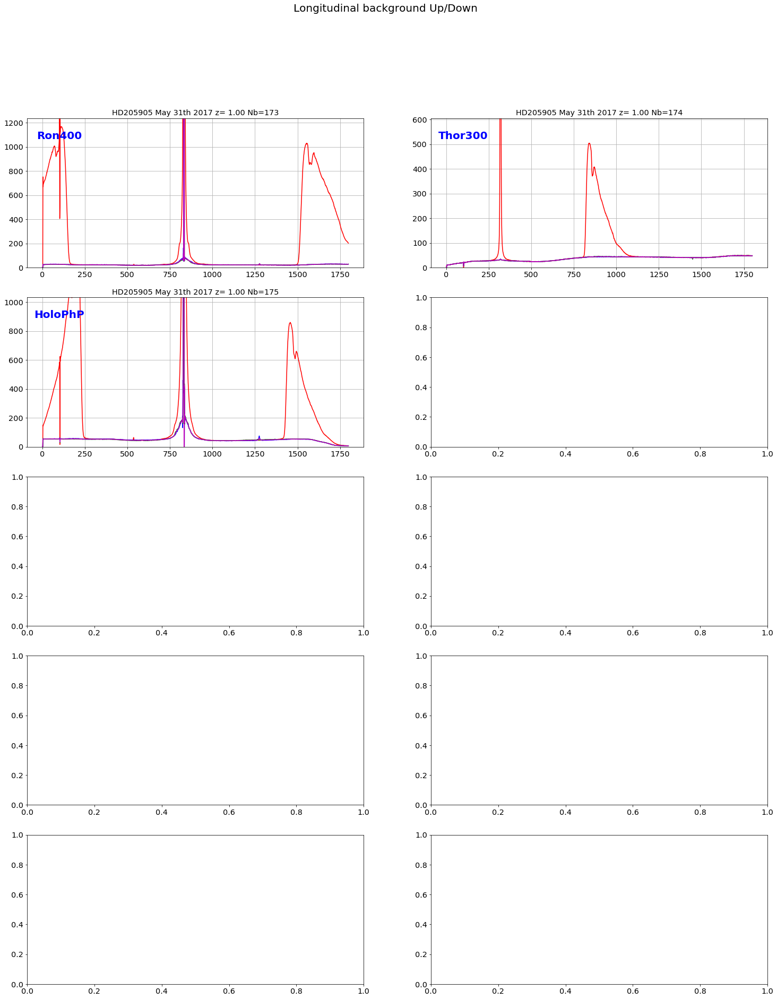

In [61]:
ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,object_name,dir_top_images)

In [62]:
def CorrectSpectrumFromBackground(spectra, background):
    """
    Background Subtraction
    """
    NBSPEC=len(spectra)
        
    corrected_spectra = []
    
    for index in np.arange(0,NBSPEC):
        corrspec=spectra[index]-background[index]
        corrected_spectra.append(corrspec)
    return corrected_spectra

In [63]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

In [64]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m
from matplotlib.backends.backend_pdf import PdfPages

def ShowSpectrumProfile(spectra,all_titles,object_name,dir_top_images,all_filt,dir_top_img):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
   
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'correctedspectrum_profile.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Spectrum 1D profile {} (backg. rem.)'.format(object_name)
    
    
    
    #f, axarr = plt.subplots(MAXIMGROW,NBIMGPERROW,figsize=(25,5*MAXIMGROW))
    #f.tight_layout()
    for index in np.arange(0,NBSPEC):
        
        # new pdf page    
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the pdf page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        axarr[iy,ix].plot(spectra[index],'r-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        
        
        star_pos=np.where(spectra[index][:spec_index_max]==spectra[index][:spec_index_max].max())[0][0]
        max_y_to_plot=(spectra[index][star_pos+star_halfwidth:spec_index_max]).max()*1.5
        
        
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(spec_index_min,max_y_to_plot*1.1/1.5, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        
        
        # save the pdf page at the botton end of the page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
    
   
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    
    

#### Here below, we plot the latera (up and down ) background which has not been subtracted
For me the background remains flat and at zero


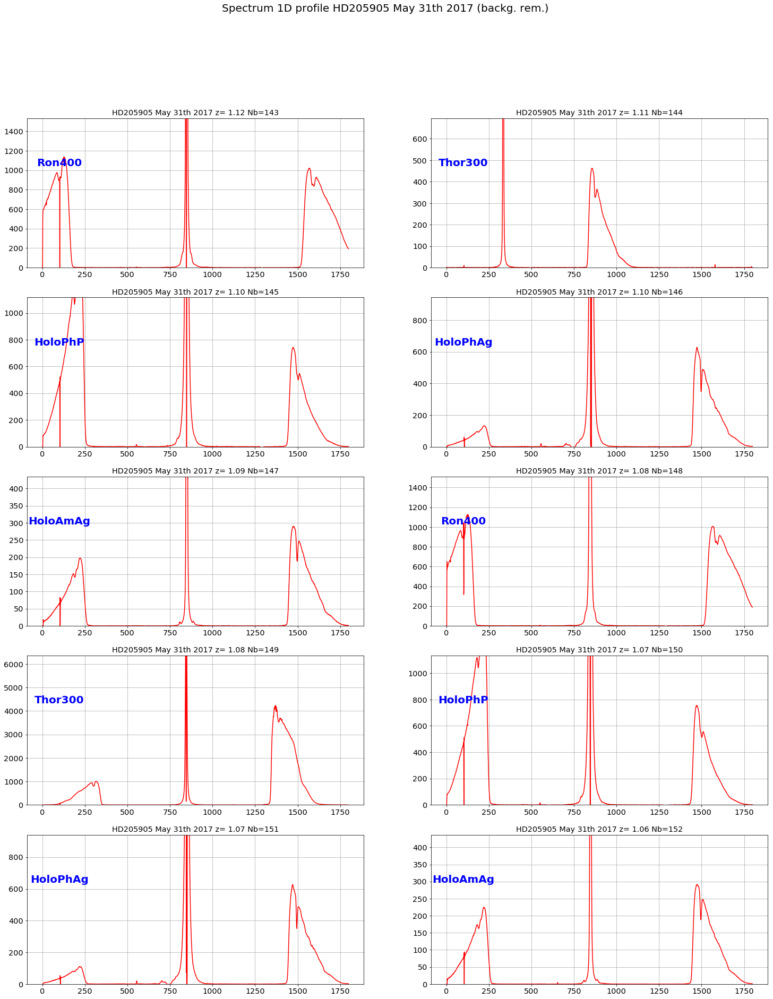

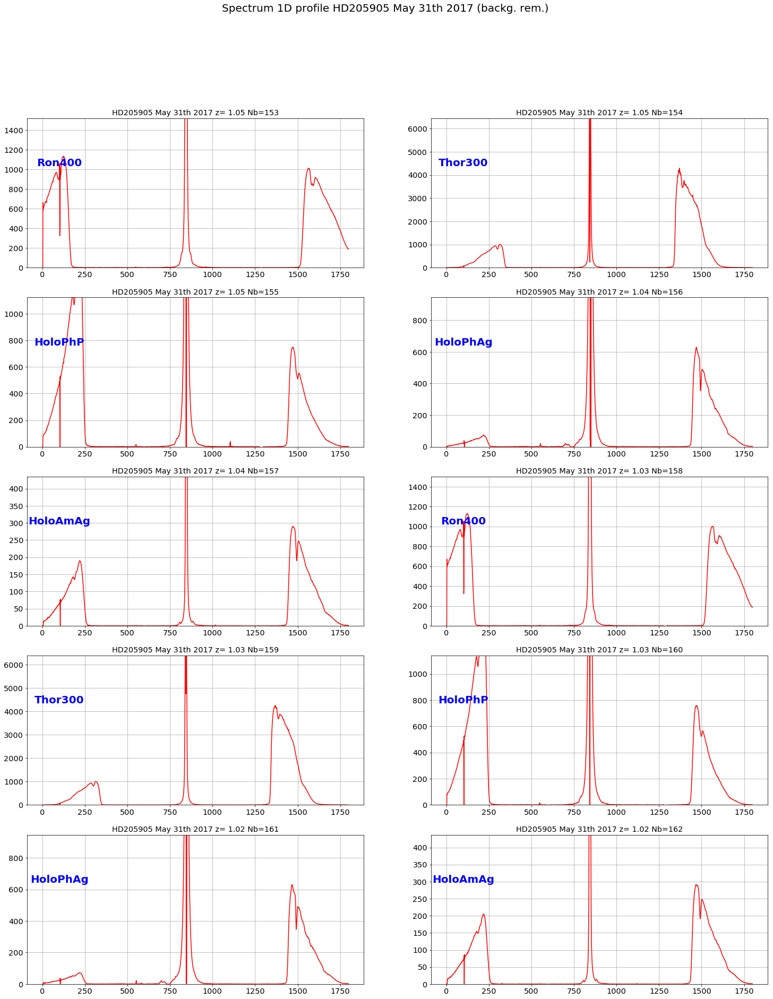

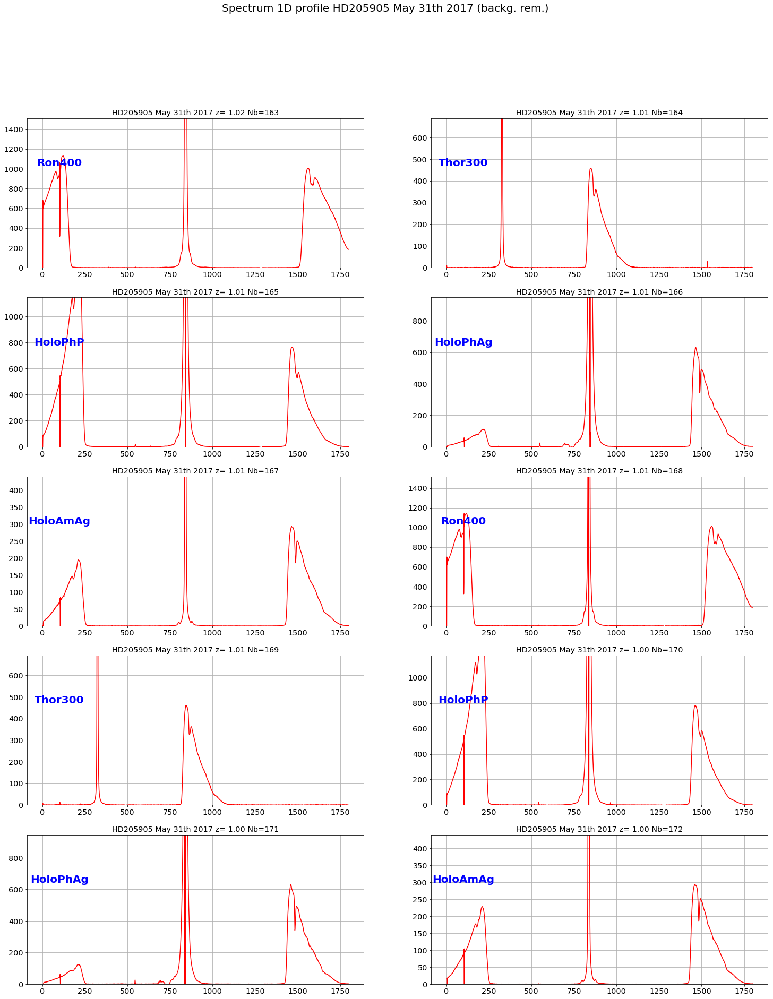

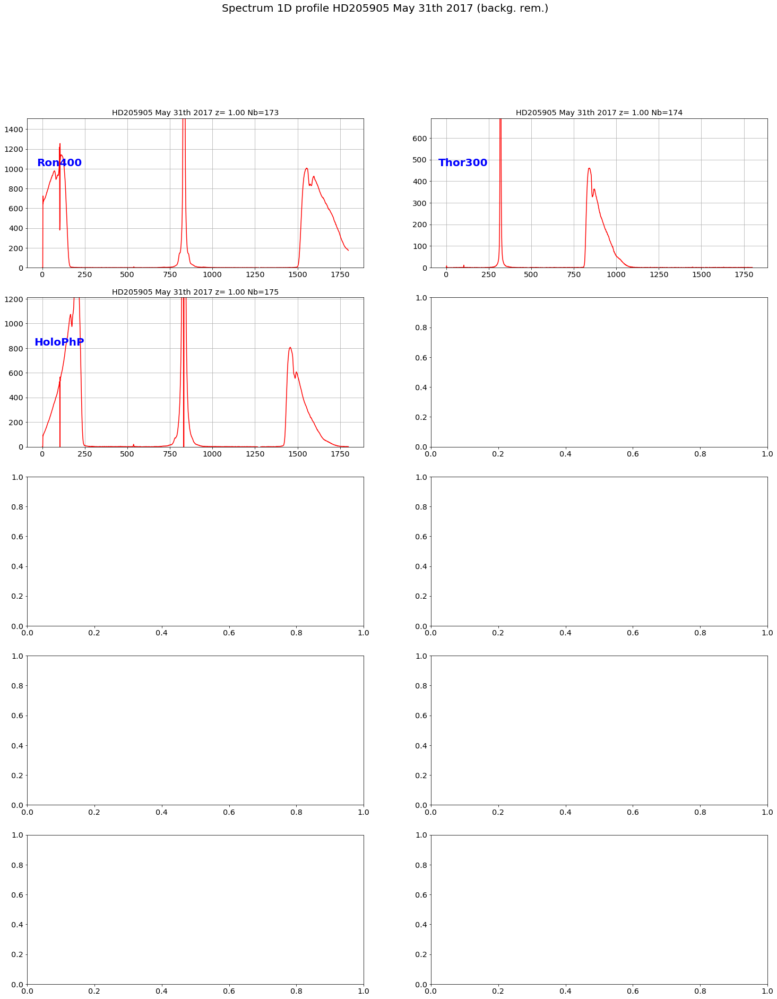

In [65]:
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,dir_top_images,all_filt,dir_top_images)

In [66]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m

from matplotlib.backends.backend_pdf import PdfPages


def ShowSpectrumRightProfile2(spectra,all_titles,object_name,dir_top_images,all_filt,dir_top_img):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    
    MAXIMGROW=max(2,int(m.ceil(float(NBSPEC)/float(NBIMGPERROW))))
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    
    
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'correctedspectrum_profile2.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    
    star_indexes = []  # list of X-pixel of central star
    
    title='Right spectra for {} (backg. rem.)'.format(object_name)
        
    for index in np.arange(0,NBSPEC):
        
        # new pdf page    
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the pdf page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        
        cutspectra=np.copy(spectra[index][spec_index_min:spec_index_max])  #remove bad ends
        
        central_star_indexes=np.where(cutspectra==cutspectra.max())  # search for the peaks
        star_index= int(central_star_indexes[0]+spec_index_min)
        
        star_indexes.append(star_index)
                           
        axarr[iy,ix].plot(spectra[index][star_index:],'r-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        
        max_y_to_plot=(spectra[index][star_index+100:spec_index_max]).max()*1.2
        
        
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
    
    
        # save the pdf page at the botton end of the page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
    
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    

    
    return star_indexes
    


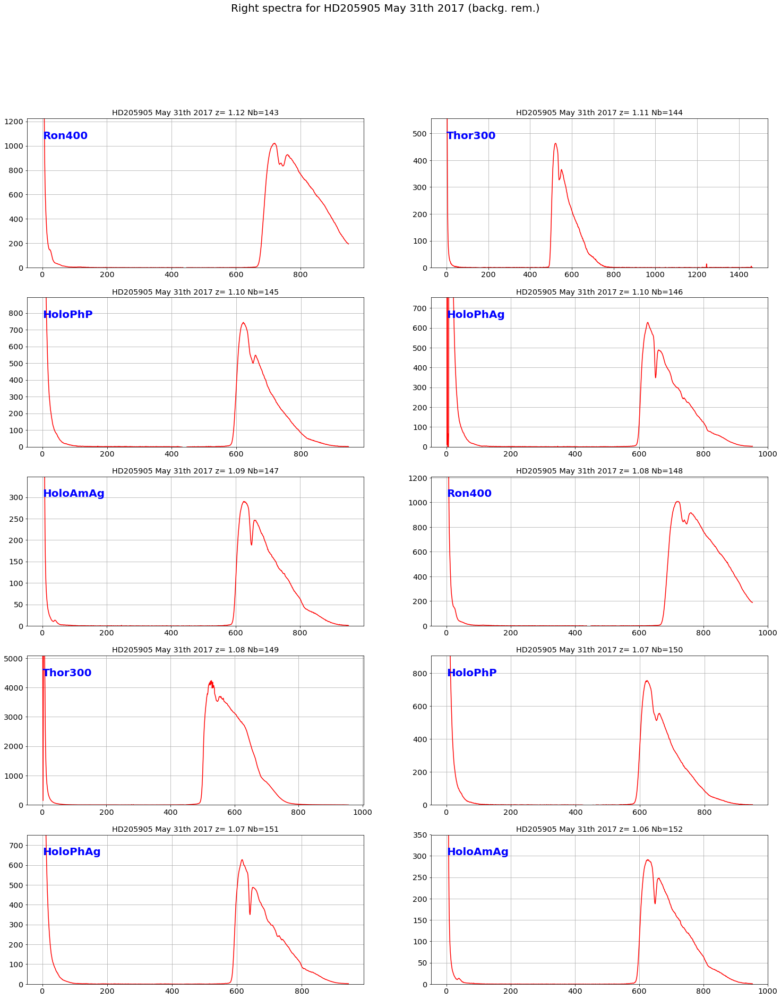

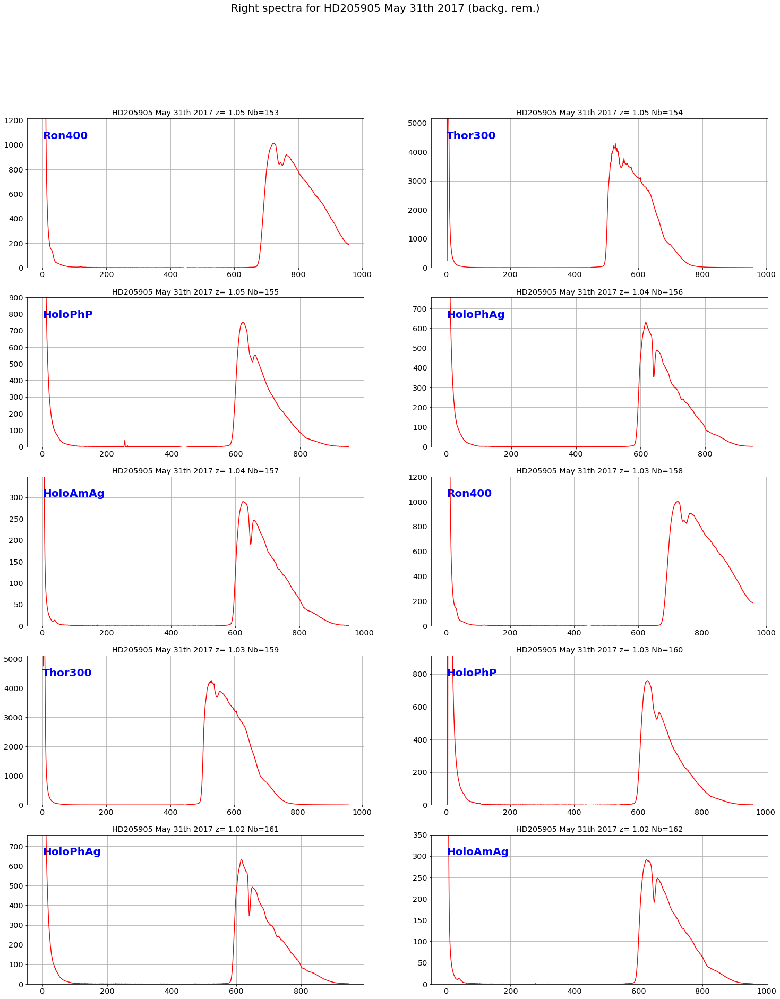

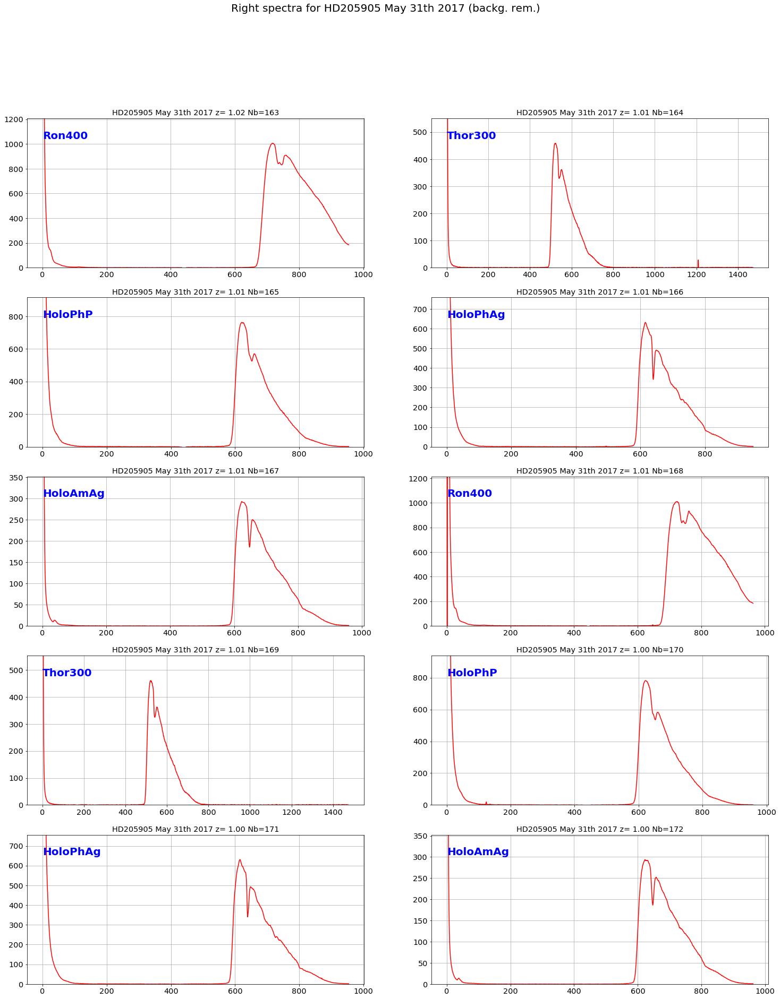

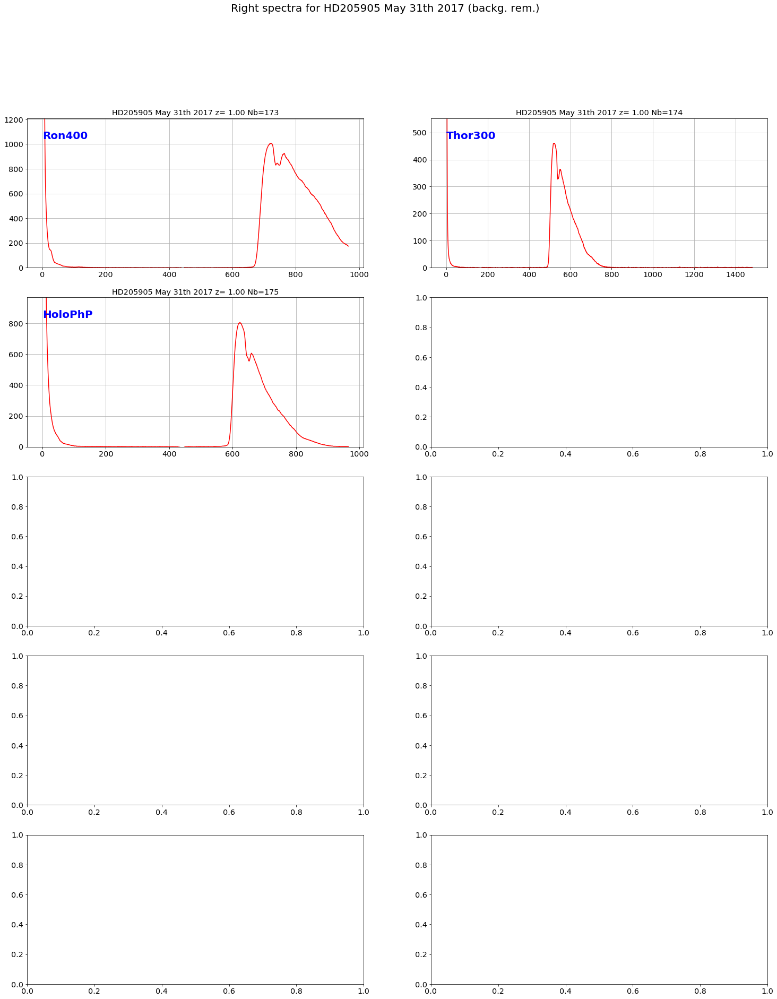

In [67]:
star_indexes=ShowSpectrumRightProfile2(thecorrspectra,all_titles,object_name,dir_top_images,all_filt,dir_top_images)

In [68]:
star_indexes

[850,
 334,
 852,
 846,
 848,
 847,
 843,
 850,
 855,
 847,
 842,
 842,
 849,
 853,
 847,
 841,
 841,
 840,
 852,
 843,
 844,
 327,
 845,
 850,
 840,
 836,
 323,
 841,
 845,
 837,
 833,
 319,
 834]

In [69]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m

from matplotlib.backends.backend_pdf import PdfPages


def ShowSpectrumLeftProfile2(spectra,all_titles,object_name,dir_top_images,all_filt,star_indexes,dir_top_img):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    
    MAXIMGROW=max(2,int(m.ceil(float(NBSPEC)/float(NBIMGPERROW))))
    
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    
    
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'correctedspectrum_profile2_left.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Left Spectra for {}'.format(object_name)
    
   
    for index in np.arange(0,NBSPEC):
        
        # new pdf page    
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the pdf page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        

        
        cutspectra=np.copy(spectra[index][0:star_indexes[index]])  #remove bad ends
  
        axarr[iy,ix].plot(cutspectra,'r-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        
        max_left_index= cutspectra.shape[0]-100
        
        max_y_to_plot=cutspectra[:max_left_index].max()*1.2
        
                
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)

        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
    
        # save the pdf page at the botton end of the page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
    
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    
    
    

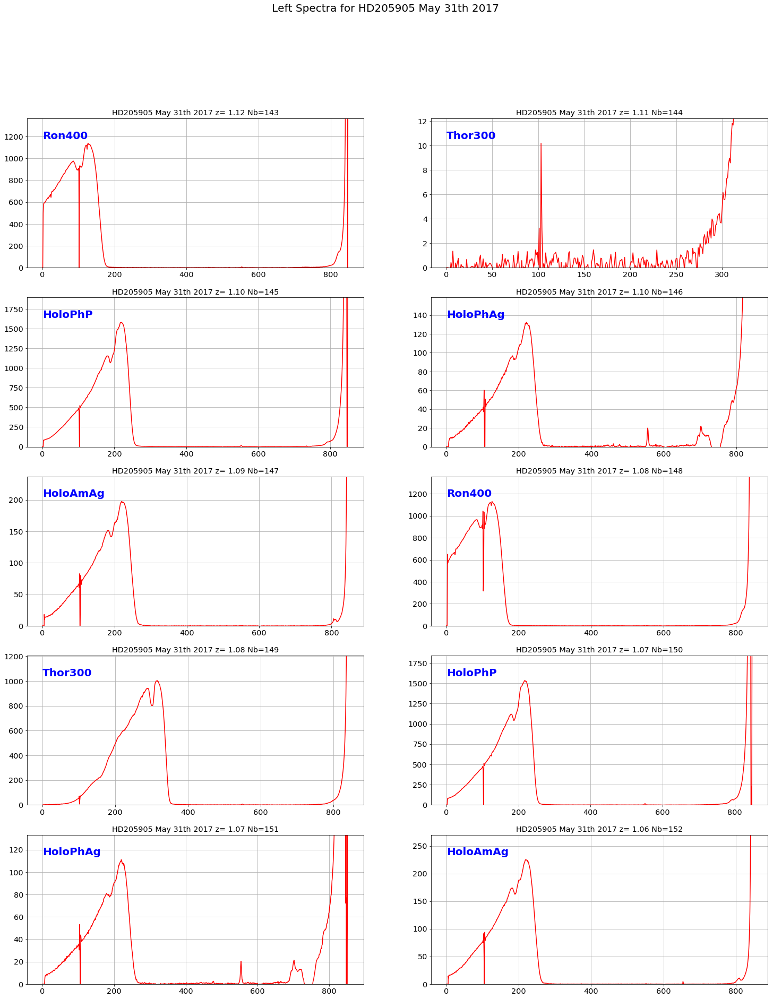

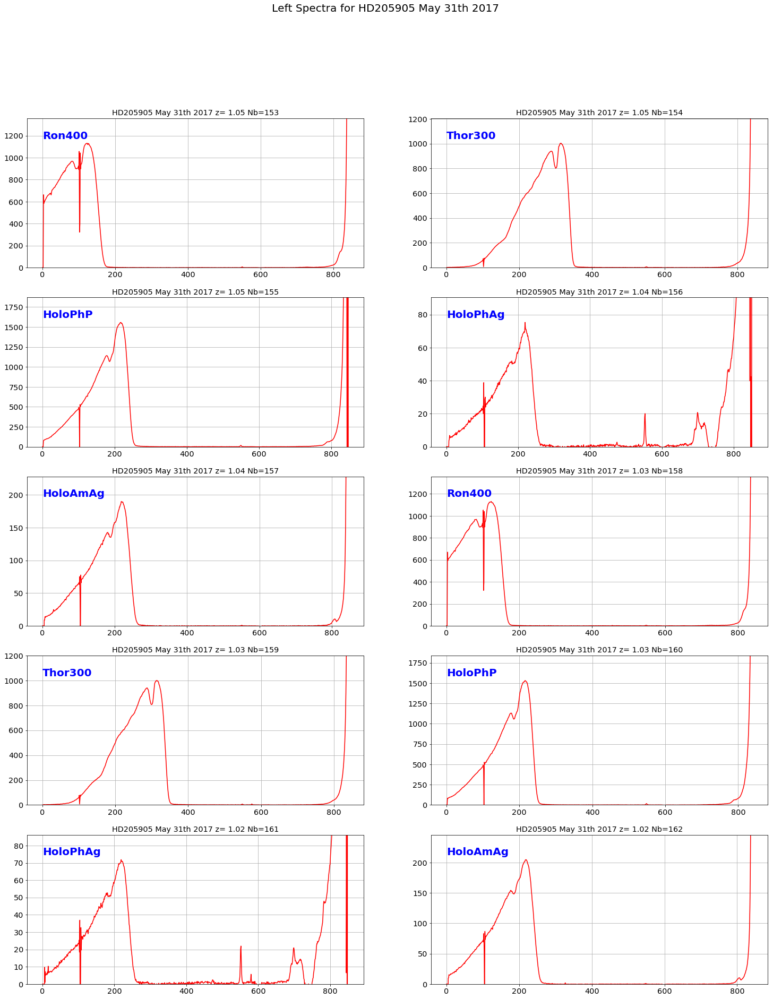

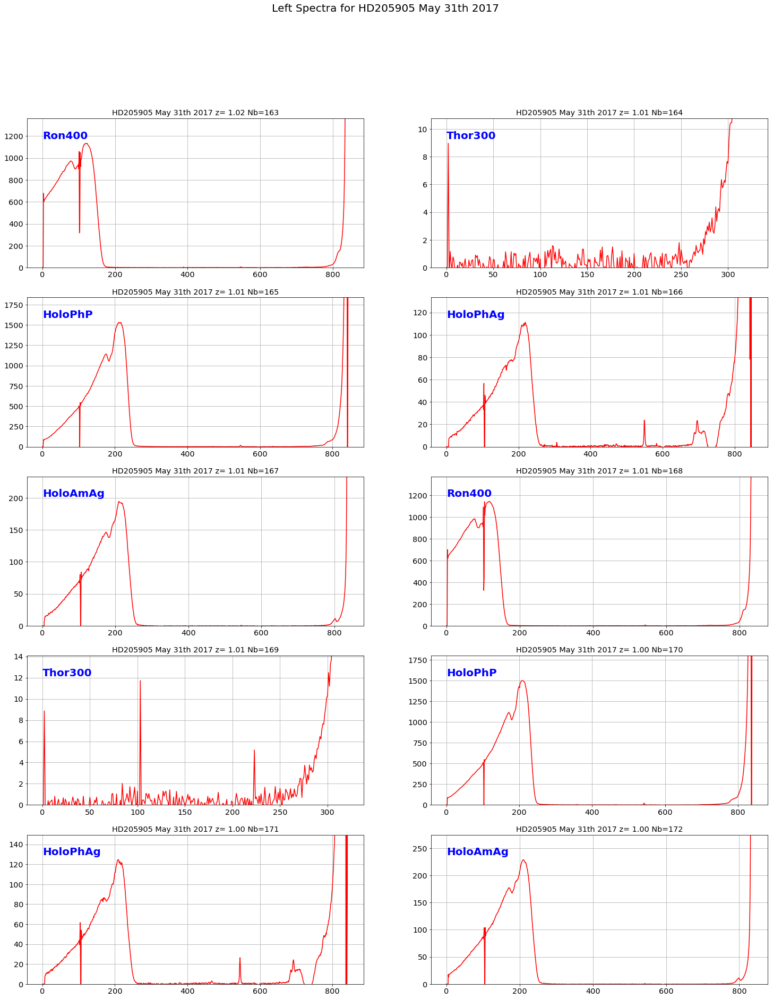

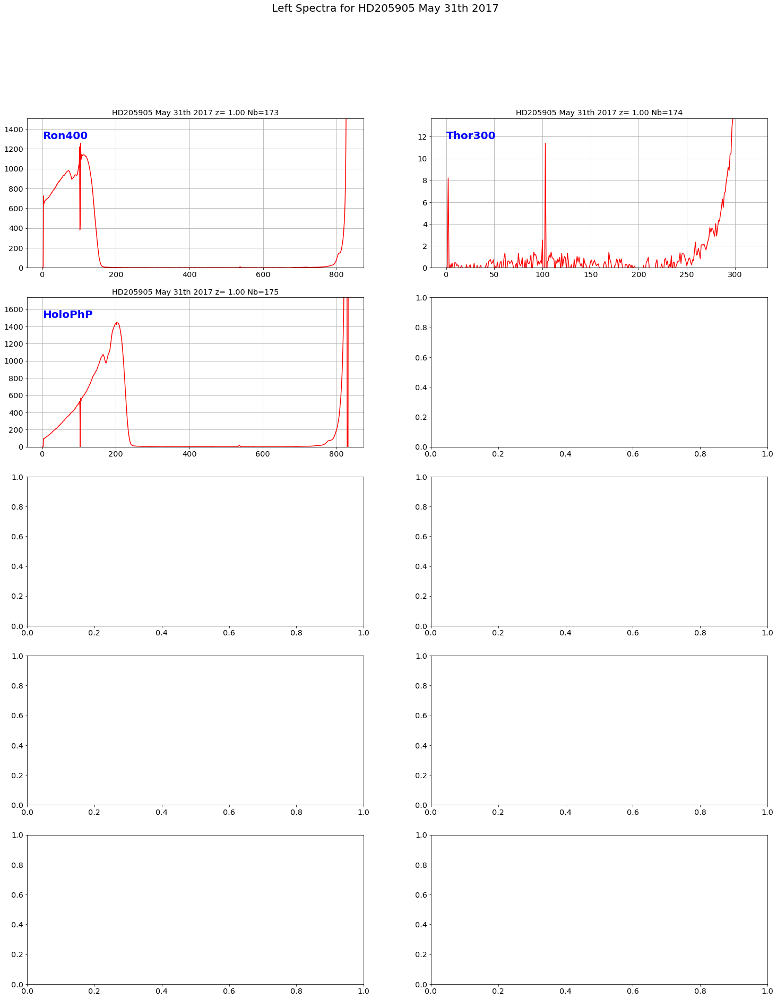

In [70]:
ShowSpectrumLeftProfile2(thecorrspectra,all_titles,object_name,dir_top_images,all_filt,star_indexes,dir_top_images)

In [71]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m

from matplotlib.backends.backend_pdf import PdfPages


def Find_CentralStar_position(spectra,all_titles,object_name,dir_top_images,all_filt,star_indexes,dir_top_img):
    """
    
    Find_CentralStar_position
    =========================
    
    Find star postion by gausian fit
    
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    
    MAXIMGROW=max(2,int(m.ceil(float(NBSPEC)/float(NBIMGPERROW))))

    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'correctedspectrum_starprofile.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Central star for {}'.format(object_name)
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    all_mean = []  # list of mean and sigma for the main central star
    all_sigma= []
    
   
    for index in np.arange(0,NBSPEC):
        
        
        # new pdf page    
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the pdf page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
    
        
        star_index=star_indexes[index]
        
        cutspectra=np.copy(spectra[index][star_index-star_halfwidth:star_index+star_halfwidth]) 
        X=np.arange(cutspectra.shape[0])+star_index-star_halfwidth
        
        # fast fit of a gaussian
        x = np.sum(X*cutspectra)/np.sum(cutspectra)
        width = 0.6*np.sqrt(np.abs(np.sum((X-x)**2*cutspectra)/np.sum(cutspectra)))
        themax = cutspectra.max()
        
        all_mean.append(int(x))
        all_sigma.append(int(width))
        
        fit = lambda t : themax*np.exp(-(t-x)**2/(2*width**2))
        
        
        #print 'mean,width, max =',x,width,themax
        thelabel='fit m={}, $\sigma$= {}'.format(int(x),int(width))
        axarr[iy,ix].plot(X,cutspectra,'r-',label='data')
        axarr[iy,ix].plot(X,fit(X), 'b-',label=thelabel)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        
        max_y_to_plot=cutspectra.max()*1.2
        
        
        axarr[iy,ix].set_ylim(0,max_y_to_plot)
        axarr[iy,ix].legend(loc=1)

        axarr[iy,ix].text(star_index-star_halfwidth/2,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='right',color='blue',fontweight='bold', fontsize=20)
    
        # save the pdf page at the botton end of the page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
    
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()



    return all_mean,all_sigma
    

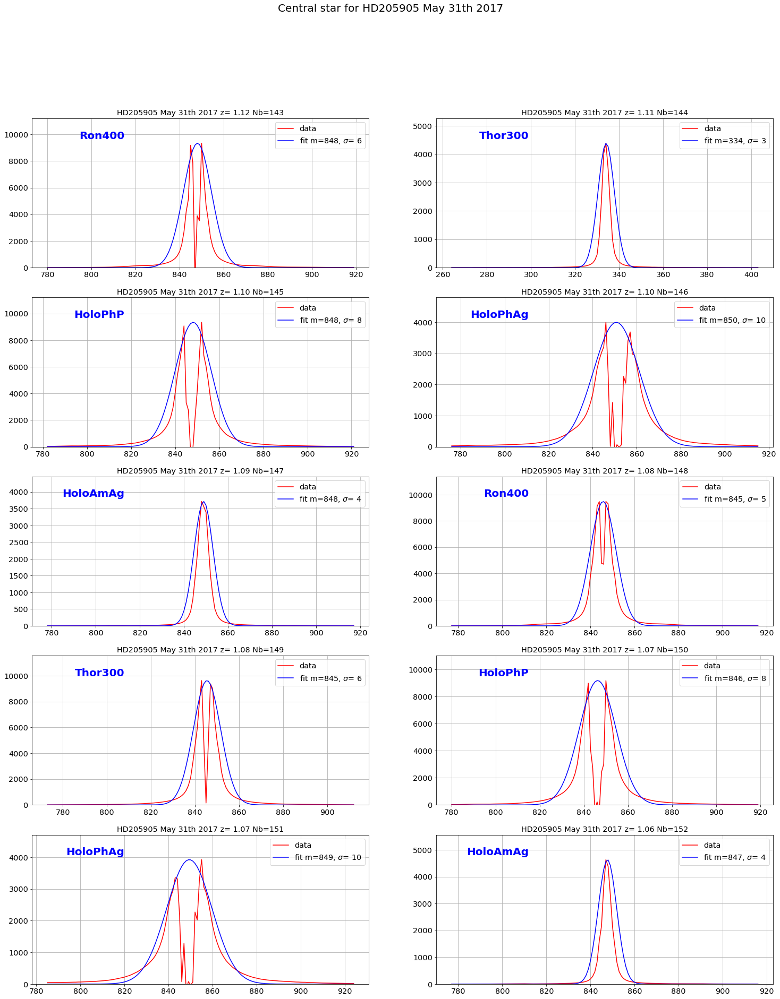

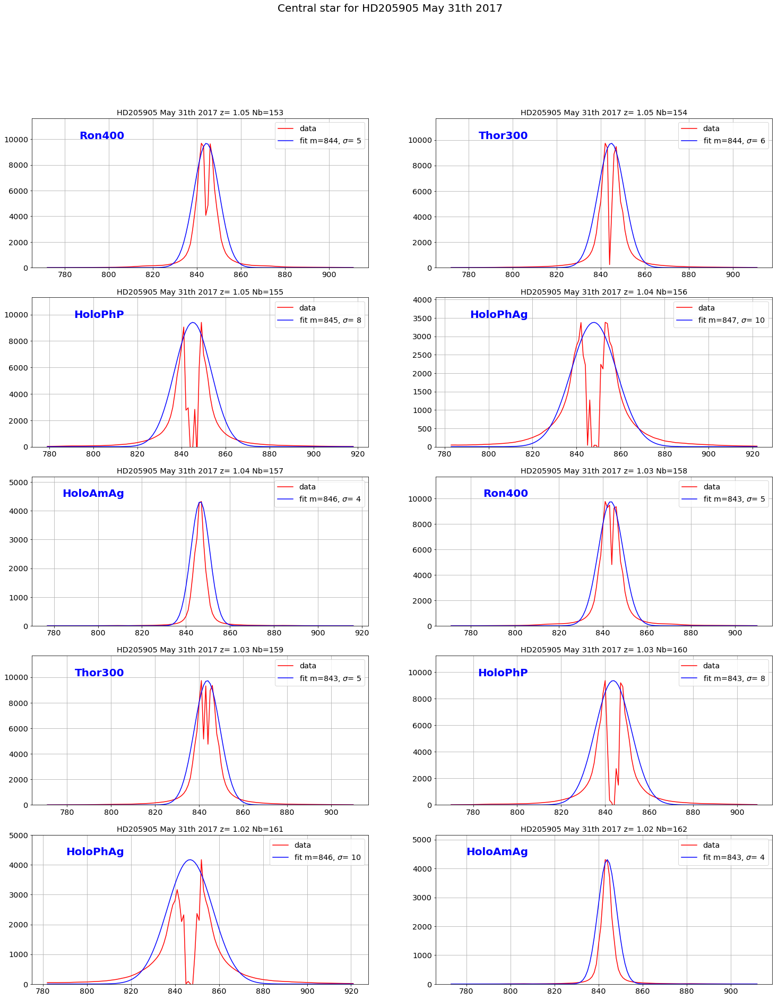

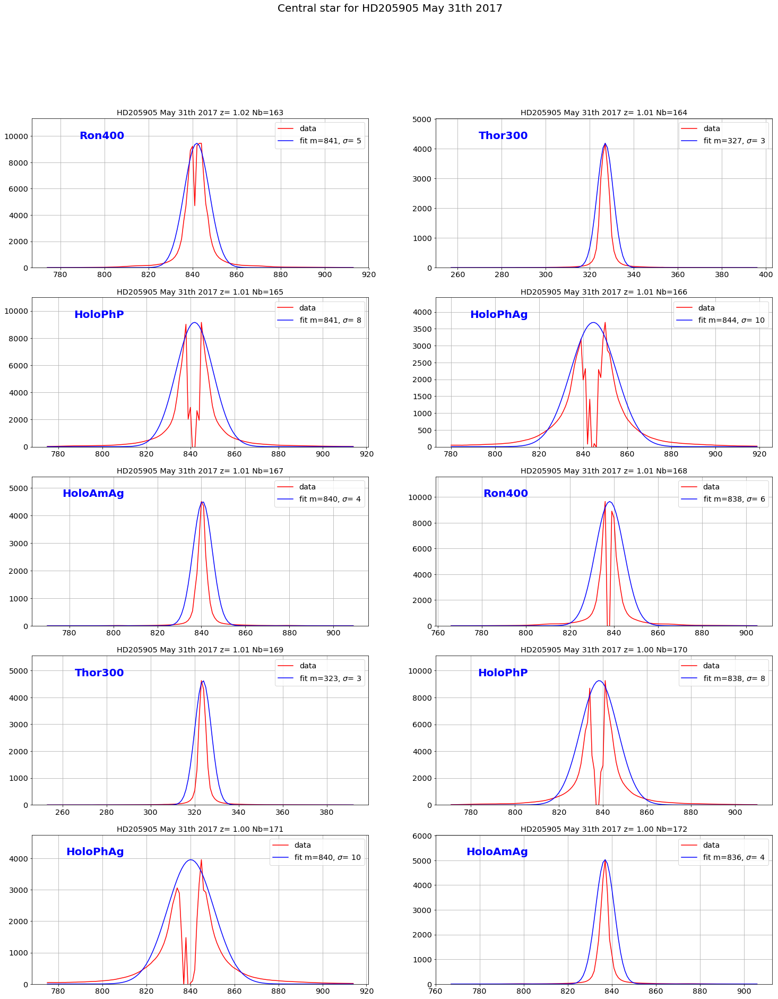

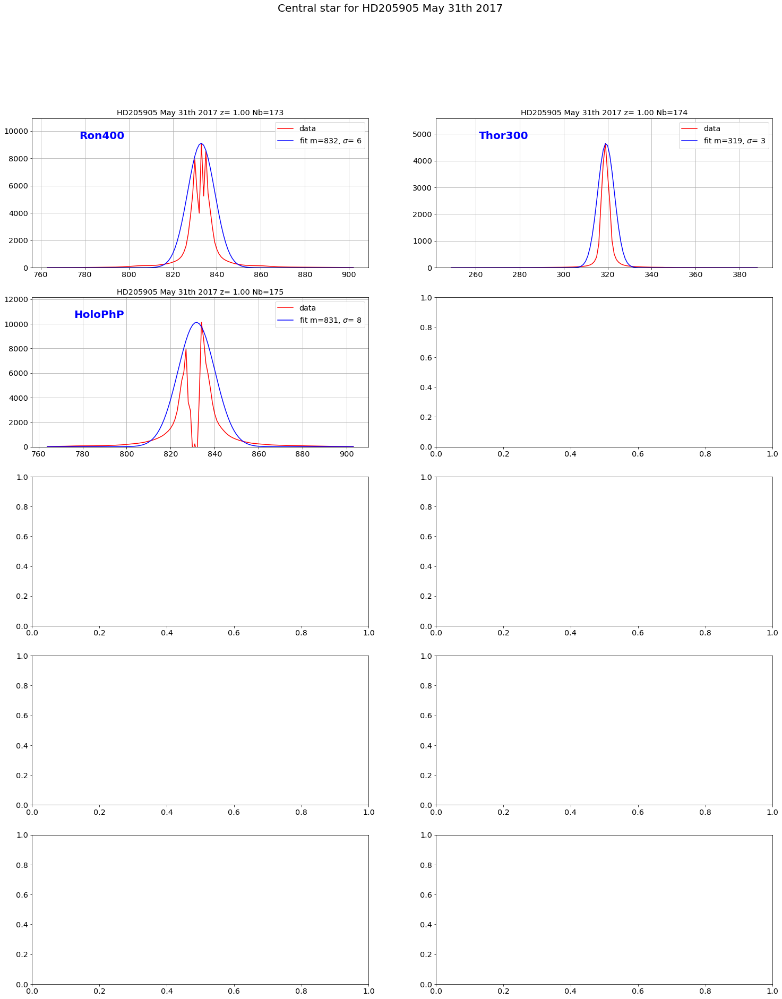

In [72]:
star_indexes_fitmean,star_indexes_fitsig=Find_CentralStar_position(thecorrspectra,all_titles,object_name,dir_top_images,all_filt,star_indexes,dir_top_images)

## Ratio between amplitudes

In [73]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import os

def SpectrumAmplitudeRatio(spectra,star_indexes):
    """
    SpectrumAmplitudeRatio: ratio of amplitudes
    =====================
    """
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=100
    
    
    ratio_list= []
    
    NBSPEC=len(spectra)
    
    for index in np.arange(0,NBSPEC):
        star_index=star_indexes[index]  # position of star
        
        max_right=spectra[index][star_index+star_halfwidth:spec_index_max].max()
        max_left=spectra[index][spec_index_min:star_index-star_halfwidth].max()
        
        ratio=max_right/max_left
        ratio_list.append(ratio) 
        
    return np.array(ratio_list)

In [74]:
ratio_of_maxamplitudes=SpectrumAmplitudeRatio(thecorrspectra,star_indexes)

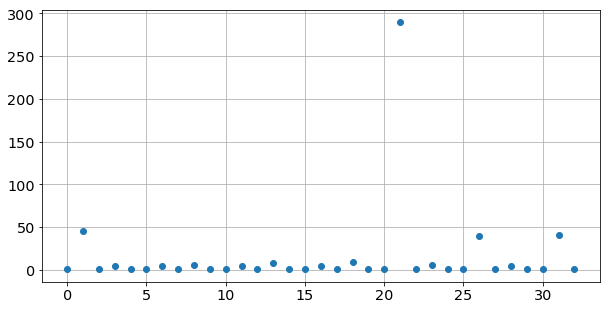

In [75]:
plt.figure(figsize=(10,5))
plt.plot(ratio_of_maxamplitudes,'o')
plt.grid()

In [76]:
print all_filt

['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP']


In [77]:
Thor300_index=np.where(np.array(all_filt) == 'Thor300')[0]
Ron400_index=np.where(np.array(all_filt) == 'Ron400')[0]
HoloPhP_index=np.where(np.array(all_filt) == 'HoloPhP')[0]
HoloPhAg_index=np.where(np.array(all_filt) == 'HoloPhAg')[0]
HoloAmAg_index=np.where(np.array(all_filt) == 'HoloAmAg')[0]

In [78]:
print Thor300_index
print Ron400_index
print HoloPhP_index
print HoloPhAg_index
print HoloAmAg_index

[ 1  6 11 16 21 26 31]
[ 0  5 10 15 20 25 30]
[ 2  7 12 17 22 27 32]
[ 3  8 13 18 23 28]
[ 4  9 14 19 24 29]


In [79]:
Thor300_ratio=ratio_of_maxamplitudes[Thor300_index]
Ron400_ratio=ratio_of_maxamplitudes[Ron400_index]
HoloPhP_ratio=ratio_of_maxamplitudes[HoloPhP_index]
HoloPhAg_ratio=ratio_of_maxamplitudes[HoloPhAg_index]
HoloAmAg_ratio=ratio_of_maxamplitudes[HoloAmAg_index]

In [80]:
Thor300_ratio_av=np.median(Thor300_ratio)
Ron400_ratio_av=np.median(Ron400_ratio)
HoloPhP_ratio_av=np.median(HoloPhP_ratio)
HoloPhAg_ratio_av=np.median(HoloPhAg_ratio)
HoloAmAg_ratio_av=np.median(HoloAmAg_ratio)

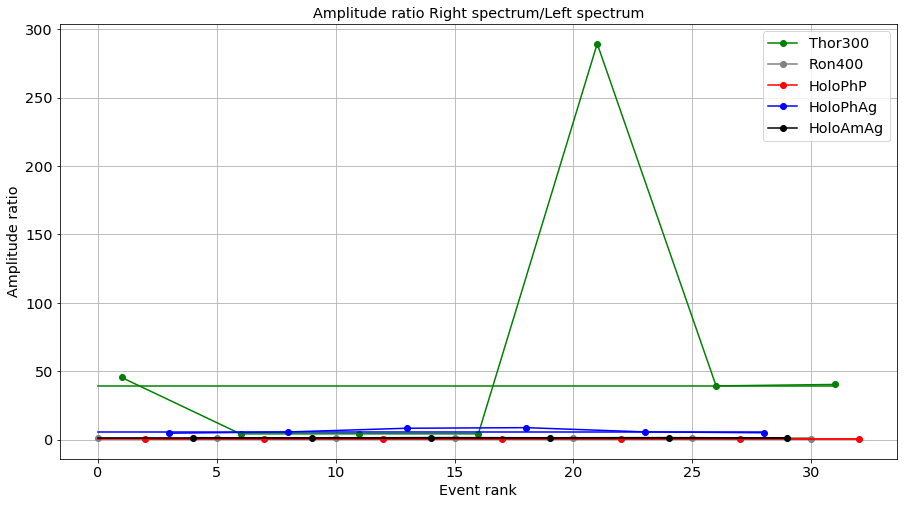

In [81]:
figfilename=os.path.join(dir_top_images,'amplitudes_ratios.pdf')

plt.figure(figsize=(15,8))

plt.plot(Thor300_index,Thor300_ratio,marker='o',color='green',label='Thor300')
plt.plot([0,Thor300_index.max()],[Thor300_ratio_av,Thor300_ratio_av],'g-')

plt.plot(Ron400_index,Ron400_ratio,marker='o',color='grey',label='Ron400')
plt.plot([0,Ron400_index.max()],[Ron400_ratio_av,Ron400_ratio_av],'-',color='grey')

plt.plot(HoloPhP_index,HoloPhP_ratio,marker='o',color='red',label='HoloPhP')
plt.plot([0,HoloPhP_index.max()],[HoloPhP_ratio_av,HoloPhP_ratio_av],'r-')


plt.plot(HoloPhAg_index,HoloPhAg_ratio,marker='o',color='blue',label='HoloPhAg')
plt.plot([0,HoloPhAg_index.max()],[HoloPhAg_ratio_av,HoloPhAg_ratio_av],'b-')

plt.plot(HoloAmAg_index,HoloAmAg_ratio,marker='o',color='black',label='HoloAmAg')
plt.plot([0,HoloAmAg_index.max()],[HoloAmAg_ratio_av,HoloAmAg_ratio_av],'k-')


plt.grid()
plt.legend(loc='best')
plt.title('Amplitude ratio Right spectrum/Left spectrum')
plt.xlabel("Event rank")
plt.ylabel("Amplitude ratio")
plt.savefig(figfilename) 

## Example of a single spectrum

In [82]:
sel=0
spectrum_sel=np.copy(thecorrspectra[sel])
star_index=star_indexes_fitmean[sel]
amplitude_ratio=ratio_of_maxamplitudes[sel]
spectrum_sel[star_index-50:star_index+50]=0

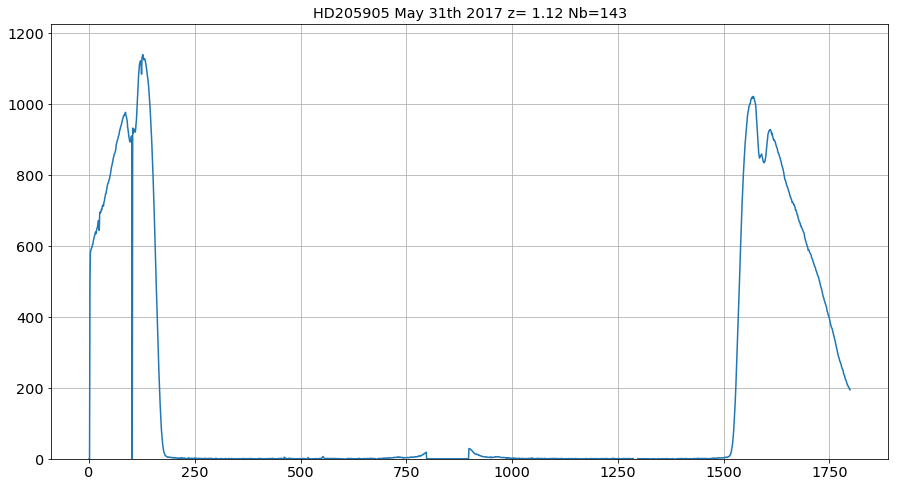

In [83]:
plt.figure(figsize=(15,8))
plt.plot(spectrum_sel)
title=all_titles[sel]
plt.title(title)
plt.grid(True)
plt.ylim(0,spectrum_sel[star_index+100:1900].max()*1.2)
figfilename=os.path.join(dir_top_images,'singlespec_sample.pdf')
plt.savefig(figfilename) 

## Cut the spectrum into two left/right part

In [84]:
def GetSpectrumBackground(inspectra,start,stop,skybg):
    '''
    Return the background    
    '''
    cropedbg=inspectra[start:stop]
    purebg=cropedbg[np.where(cropedbg!=skybg)]  # remove region of the bing star
    
    return purebg

In [85]:
def SeparateSpectra(inspectra,x0):
    '''
    Cut the two spectra
    '''
    rightspectra=inspectra[x0:]
    revleftspectra=inspectra[:x0]
    leftspectra=   revleftspectra[::-1]
    #rightspectra=rightspectra[np.where(rightspectra>0)]
    #leftspectra=leftspectra[np.where(leftspectra>0)]
    
    return leftspectra,rightspectra

In [86]:
def DiffSpectra(spec1,spec2,bg):
    '''
    Make the difference of the tow spectra 
    
    '''
    N1=spec1.shape[0]
    N2=spec2.shape[0]
    N=np.min([N1,N2])
    spec1_croped=spec1[0:N]
    spec2_croped=spec2[0:N]
    diff_spec=np.average((spec1_croped-spec2_croped)**2)/bg**2
    return diff_spec  

In [87]:
def FindCenter(fullspectrum,xmin,xmax,specbg,factor=1):
    '''
    - spec1 is left spectra
    - spec2 is right spectra
    
    In case of asymetric orders one can use a multiplication factor
    '''   
    all_x0=np.arange(xmin,xmax,1)
    NBPOINTS=np.shape(all_x0)
    chi2=np.zeros(NBPOINTS)
    for idx,x0 in np.ndenumerate(all_x0):
        spec1,spec2=SeparateSpectra(fullspectrum,x0) #sparate the spectra in two pieces
        
        spec1_factor=spec1*factor
        #chi2[idx]=DiffSpectra(spec1,spec2,specbg)
        chi2[idx]=DiffSpectra(spec1_factor,spec2,specbg)
    return all_x0,chi2

In [88]:
xmin_center=500
xmax_center=1000
skybg=1

In [89]:
all_candidate_center,all_chi2=FindCenter(spectrum_sel,xmin_center,xmax_center,1,factor=amplitude_ratio)

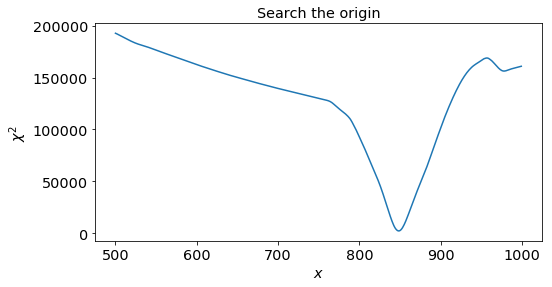

In [90]:
fig = plt.figure(figsize=(8,4))
plt.plot(all_candidate_center,all_chi2)
plt.title('Search the origin')
plt.ylabel('$\chi^2$')
plt.xlabel('$x$')
#plt.ylim(0,200.)


In [91]:
# find where is the minimum of chi2
indexmin=np.where(all_chi2==all_chi2.min())[0]
theorigin=all_candidate_center[indexmin]
print indexmin[0],theorigin[0],all_chi2.min()

348 848 2448.55795667


In [92]:
spec1,spec2=SeparateSpectra(spectrum_sel,theorigin[0])

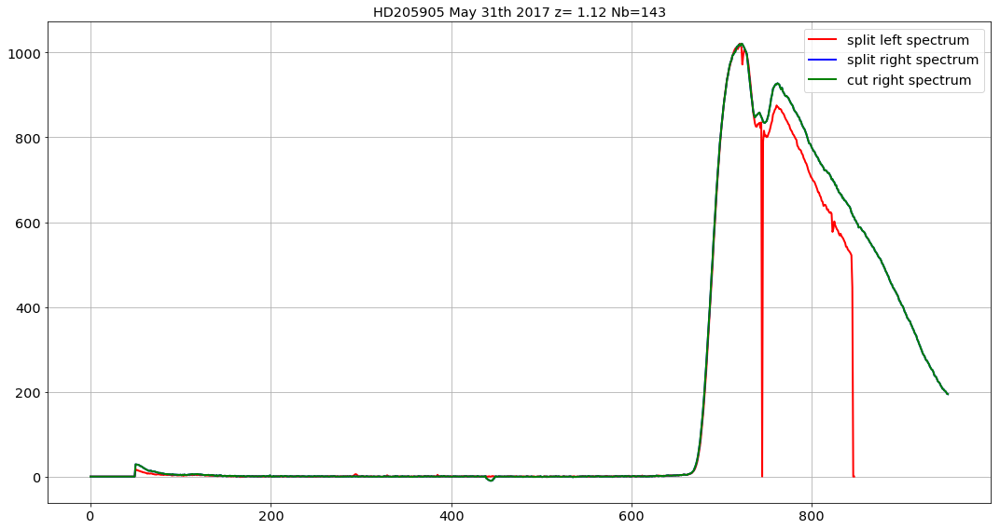

In [93]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(spec1*amplitude_ratio,'r-',lw=2,label='split left spectrum')
ax.plot(spec2,'b-',lw=2,label='split right spectrum')
ax.plot(spectrum_sel[star_index:],'g-',lw=2,label='cut right spectrum')
plt.title(title)
plt.tight_layout()
plt.grid(True)
plt.legend(loc='best')

In [94]:
#%%cython
#import numpy as np
#import matplotlib.pyplot as plt
#import os
#import math as m

#from matplotlib.backends.backend_pdf import PdfPages



def SplitSpectrumProfile(spectra,all_titles,object_name,star_indexes,dir_top_img, Thor300_ind,Ron400_ind,HoloPhP_ind,HoloPhAg_ind,HoloAmAg_ind):
    """
    SplitSpectrumProfile: Split the spectrum in two parts
    =====================
    """
    NBIMGPERROW=2
    NBSPEC=len(spectra)
    
    MAXIMGROW=max(2,int(m.ceil(float(NBSPEC)/float(NBIMGPERROW))))
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'split_spectra.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    
    title='Multiple 1D Spectra 1D for '.format(object_name)
    
    
    skybg=1
    spectra_left=[]  # container for spectra for split mode (left/right symetry)
    spectra_right=[]
    
    spectra_left_2=[] # container for spectra for cut mode (central star positon)
    spectra_right_2=[]
    
   
    
    for index in np.arange(0,NBSPEC):
        
        
        # new pdf page    
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the pdf page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        
        star_index=star_indexes[index]

        if np.any(Thor300_ind == index):
            factor=Thor300_ratio_av
        elif np.any(Ron400_ind == index):
            factor=Ron400_ratio_av
        elif np.any(HoloPhP_ind == index):
            factor=HoloPhP_ratio_av
        elif np.any(HoloPhAg_ind == index):
            factor=HoloPhAg_ratio_av
        elif np.any(HoloAmAg_ind == index):
            factor=HoloAmAg_ratio_av
        else:
            print "disperser not found "
            factor=1
        
        spectrum_sel=np.copy(spectra[index])
        
        spectrum_sel[star_index-star_halfwidth:star_index+star_halfwidth]=0  # erase central star
        
        
        all_candidate_center,all_chi2=FindCenter(spectrum_sel,xmin_center,xmax_center,skybg,factor)
        
        indexmin=np.where(all_chi2==all_chi2.min())[0]
        theorigin=all_candidate_center[indexmin]
        
        #print index, theorigin
        
        # old split by chi2 min
        spec1,spec2=SeparateSpectra(spectrum_sel,theorigin[0])
        
        spectra_left.append(spec1)
        spectra_right.append(spec2)
        
        # new split by central star position
        spec3,spec4=SeparateSpectra(spectrum_sel,star_index)
        
        spectra_left_2.append(spec3)
        spectra_right_2.append(spec4)
        
        axarr[iy,ix].plot(spec4,'r-',lw=2,label='cut right spec')
        axarr[iy,ix].plot(spec3*factor,'b-',lw=1,label='renorm cut right left')
        
        axarr[iy,ix].plot(spec2,'m-',lw=2,label='split right spec')
        axarr[iy,ix].plot(spec1*factor,'k-',lw=1,label='renorm split left spec')
        
    
        max_y_to_plot=spec2[:spec_index_max].max()*1.2
        
        
        axarr[iy,ix].legend(loc=1)                  
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
    
   
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
    
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()    
  
    
    return spectra_left,spectra_right,spectra_left_2,spectra_right_2

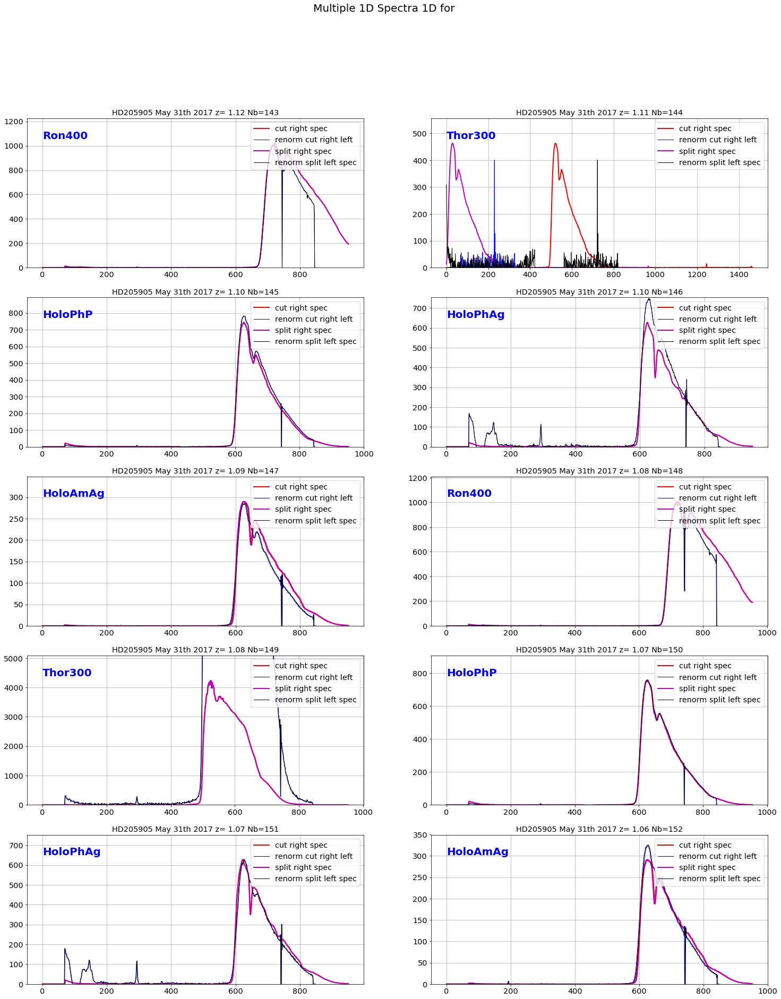

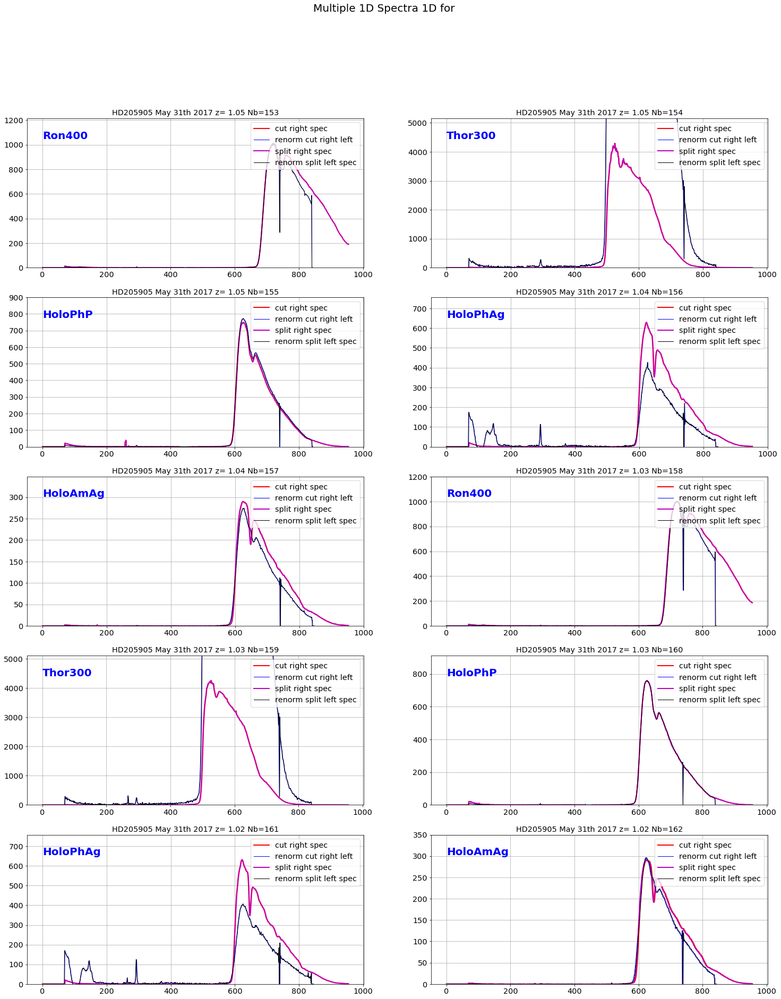

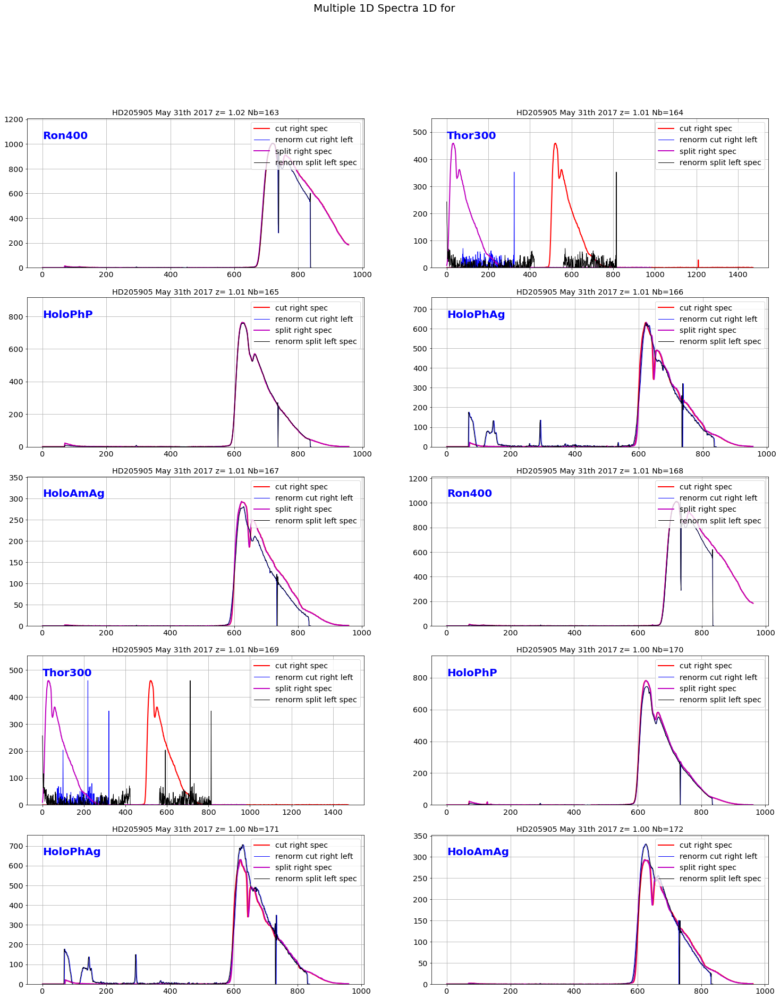

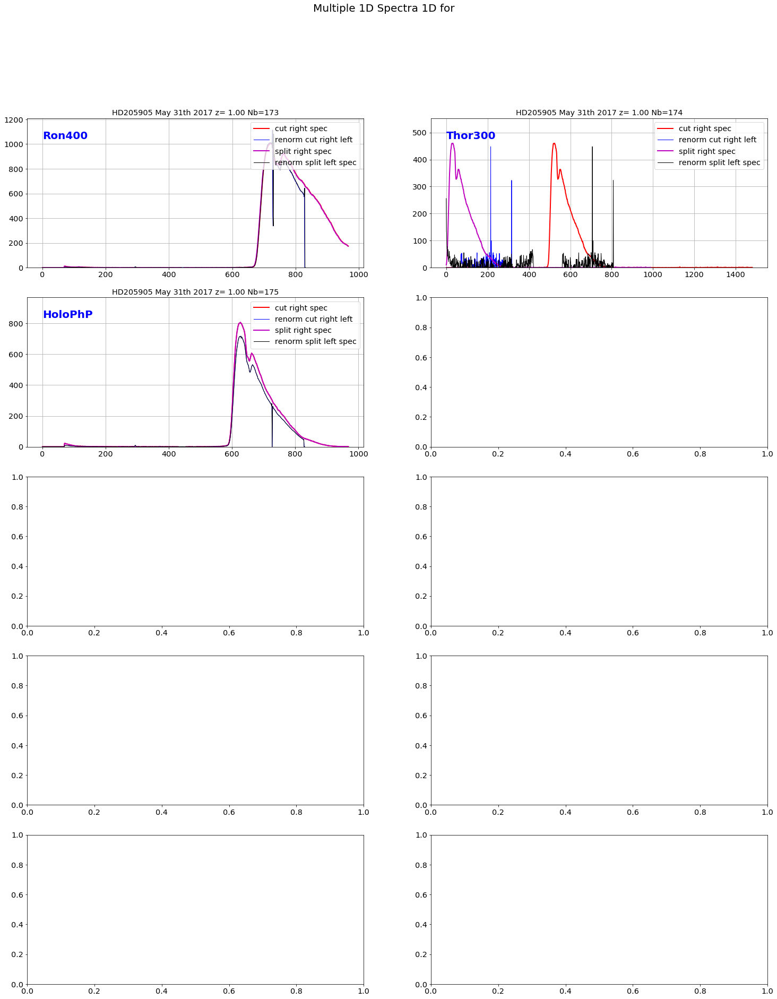

In [95]:
spectra_left,spectra_right,spectra_left_final,spectra_right_final=SplitSpectrumProfile(thecorrspectra,all_titles,object_name,star_indexes_fitmean,dir_top_images, Thor300_index,Ron400_index,HoloPhP_index,HoloPhAg_index,HoloAmAg_index)

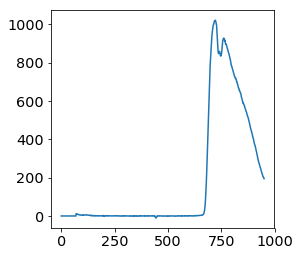

In [96]:
plt.plot(spectra_right_final[0])

## Superpositions of Spectra

In [97]:
def CompareSpectrumProfile(spectra,all_titles,object_name,all_filt,dir_top_img,grating_name):
    """
    CompareSpectrumProfile
    =====================
    
    """
    shortfilename='CompareSpec_'+grating_name+'.pdf'
    title="Compare spectra of {} with disperser {}".format(object_name,grating_name)
    figfilename=os.path.join(dir_top_img,shortfilename)
    pp = PdfPages(figfilename) # create a pdf file
    
    
    f, axarr = plt.subplots(1,1,figsize=(25,15))
    f.suptitle(title,size=20)
    
    NBSPEC=len(spectra)
    
    min_z=min(all_airmass)
    max_z=max(all_airmass)
    
    maxim_y_to_plot= []

    texte='airmass : {} - {} '.format(min_z,max_z)
    
    for index in np.arange(0,NBSPEC):
                
        if re.search(grating_name,all_filt[index]):
            axarr.plot(spectra[index],'-')
            maxim_y_to_plot.append(spectra[index].max())
    
    max_y_to_plot=max(maxim_y_to_plot)
    axarr.set_ylim(0,max_y_to_plot)
    axarr.text(0.,max_y_to_plot*0.9, texte ,verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
    axarr.grid(True)
    axarr.set_xlabel("pixel")
    
        
    f.savefig(pp, format='pdf')
    f.show()
    
    pp.close()     
    
    
    

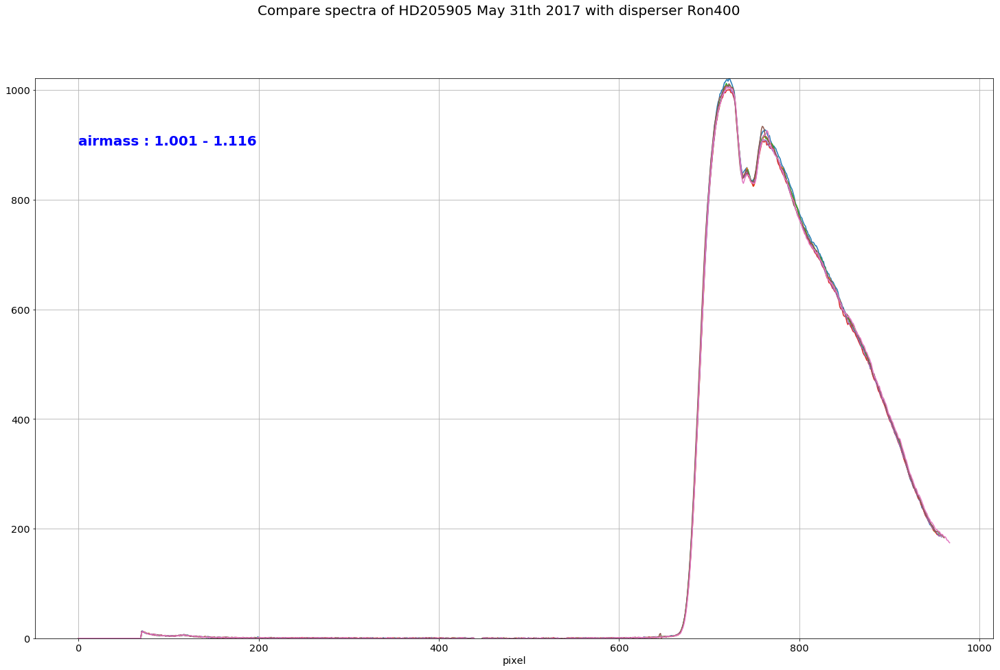

In [98]:
CompareSpectrumProfile(spectra_right_final,all_titles,object_name,all_filt,dir_top_images,'Ron400')

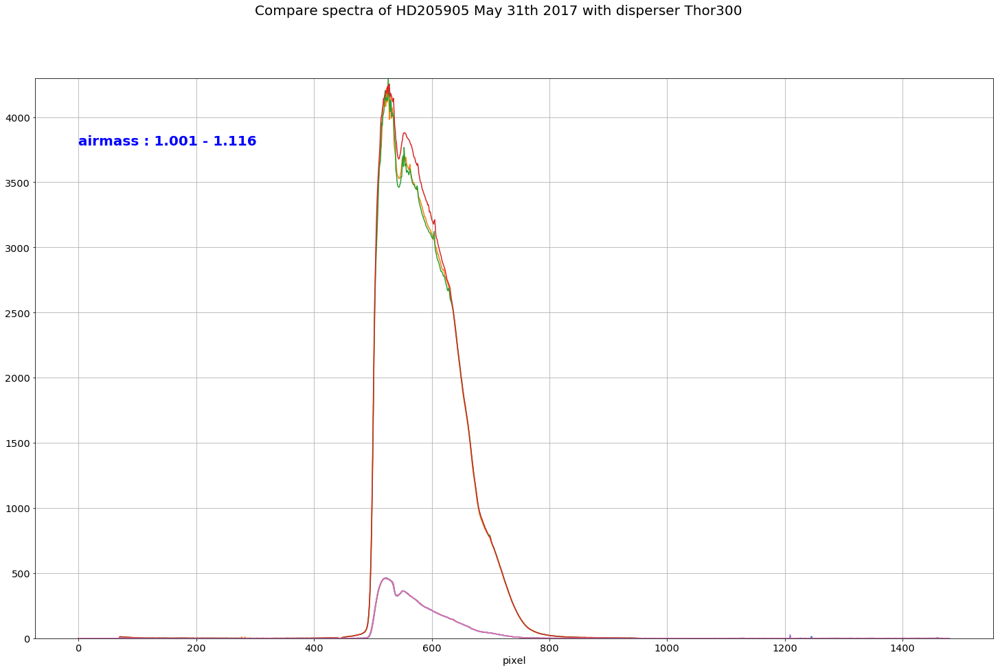

In [99]:
CompareSpectrumProfile(spectra_right_final,all_titles,object_name,all_filt,dir_top_images,'Thor300')

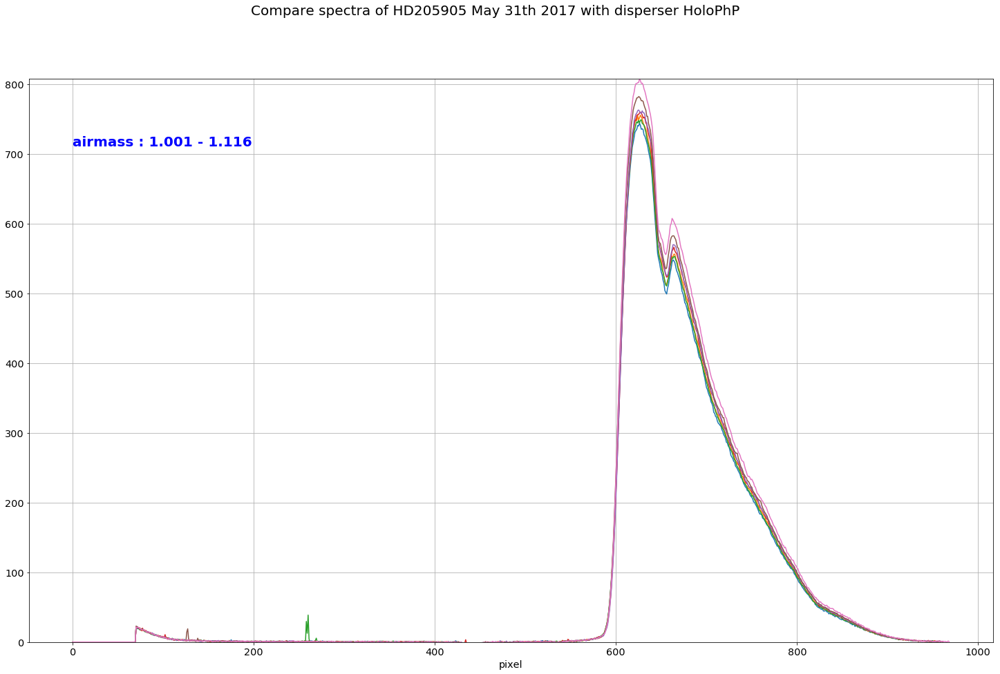

In [100]:
CompareSpectrumProfile(spectra_right_final,all_titles,object_name,all_filt,dir_top_images,'HoloPhP')

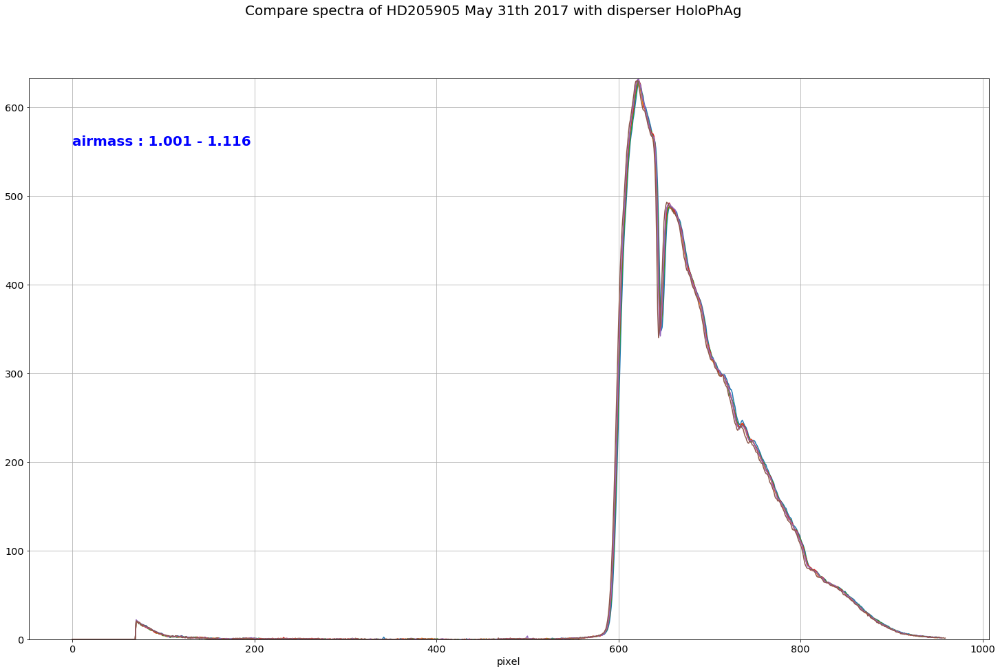

In [101]:
CompareSpectrumProfile(spectra_right_final,all_titles,object_name,all_filt,dir_top_images,'HoloPhAg')

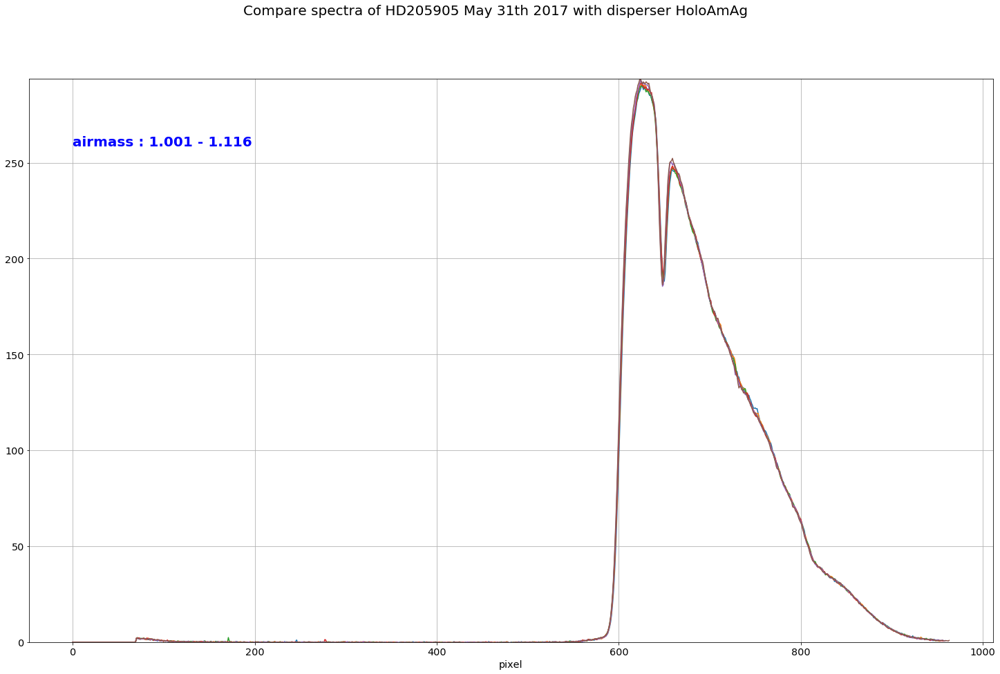

In [102]:
CompareSpectrumProfile(spectra_right_final,all_titles,object_name,all_filt,dir_top_images,'HoloAmAg')

## Save results

In [103]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [104]:
newfullfilenames

['./spectrum_fitsspec/finalSpectra_20170531_143.fits',
 './spectrum_fitsspec/finalSpectra_20170531_144.fits',
 './spectrum_fitsspec/finalSpectra_20170531_145.fits',
 './spectrum_fitsspec/finalSpectra_20170531_146.fits',
 './spectrum_fitsspec/finalSpectra_20170531_147.fits',
 './spectrum_fitsspec/finalSpectra_20170531_148.fits',
 './spectrum_fitsspec/finalSpectra_20170531_149.fits',
 './spectrum_fitsspec/finalSpectra_20170531_150.fits',
 './spectrum_fitsspec/finalSpectra_20170531_151.fits',
 './spectrum_fitsspec/finalSpectra_20170531_152.fits',
 './spectrum_fitsspec/finalSpectra_20170531_153.fits',
 './spectrum_fitsspec/finalSpectra_20170531_154.fits',
 './spectrum_fitsspec/finalSpectra_20170531_155.fits',
 './spectrum_fitsspec/finalSpectra_20170531_156.fits',
 './spectrum_fitsspec/finalSpectra_20170531_157.fits',
 './spectrum_fitsspec/finalSpectra_20170531_158.fits',
 './spectrum_fitsspec/finalSpectra_20170531_159.fits',
 './spectrum_fitsspec/finalSpectra_20170531_160.fits',
 './spectr

### Save outputfilename

In [105]:
#
#  New fashion to save a binary table outside the primary header
#
for idx,file in np.ndenumerate(newfullfilenames):
    primhdu = fits.PrimaryHDU(header=all_header[idx[0]])   # make an primary HDU without data
    
    col1=fits.Column(name='RawLeftSpec',format='E',array=spectra_left_final[idx[0]])
    col2=fits.Column(name='RawRightSpec',format='E',array=spectra_right_final[idx[0]])
    cols=fits.ColDefs([col1,col2])
    
    tbhdu = fits.BinTableHDU.from_columns(cols)     # new binary table HDU
    thdulist = fits.HDUList([primhdu, tbhdu])
    
    thdulist.writeto(file,overwrite=True)